In [34]:
#always run this first!!
#essential reticulate functions that allow us to use python packages in R
#you'll need a conda env with 'leidenalg' and 'pandas' installed to do this
#then route reticulate to the python installed in that conda env with the below functions
Sys.setenv(RETICULATE_PYTHON="/home/welison/.conda/envs/decontX_reticulate/bin/python")
library(reticulate)
reticulate::use_python("/home/welison/.conda/envs/decontX_reticulate/bin/python")
reticulate::use_condaenv("/home/welison/.conda/envs/decontX_reticulate")
reticulate::py_module_available(module='leidenalg') #needs to be TRUE
reticulate::import('leidenalg') #good to make sure this doesn't error

[1] TRUE

Module(leidenalg)

In [33]:
#is you get messages that any of these packages aren't installed
#go ahead and locally install them yourself using install.packages()

#library(GenomeInfoDb,lib.loc="/nfs/lab/welison/multiome_practice/lib/")

#suppressMessages(library(hdf5r))
suppressMessages(library(Seurat))
suppressMessages(library(Signac))
suppressMessages(library(EnsDb.Hsapiens.v86))
suppressMessages(library(dplyr))
suppressMessages(library(ggplot2))
suppressMessages(library(Matrix))
#install.packages('harmony')
suppressMessages(library(harmony))
suppressMessages(library(data.table))
#suppressMessages(library(ggpubr))
library(gridExtra)
warnLevel <- getOption('warn')
options(warn = -1)
library(BPCells)
library(stringr)
library(tidyr)
#library(ggh4x) # Luca's Dotplot code
library(presto)

Warning message:
"package 'ensembldb' was built under R version 4.3.2"
Warning message:
"package 'BiocGenerics' was built under R version 4.3.2"
Warning message:
"package 'GenomicRanges' was built under R version 4.3.3"
Warning message:
"package 'S4Vectors' was built under R version 4.3.3"
Warning message:
"package 'IRanges' was built under R version 4.3.3"
Warning message:
"package 'GenomeInfoDb' was built under R version 4.3.2"
Warning message:
"package 'GenomicFeatures' was built under R version 4.3.2"
Warning message:
"package 'AnnotationDbi' was built under R version 4.3.2"
Warning message:
"package 'Biobase' was built under R version 4.3.3"
Warning message:
"package 'AnnotationFilter' was built under R version 4.3.2"
Warning message:
"package 'dplyr' was built under R version 4.3.2"
Warning message:
"package 'Matrix' was built under R version 4.3.2"
Warning message:
"package 'harmony' was built under R version 4.3.2"

Attaching package: 'gridExtra'


The following object is maske

In [35]:
library(RhpcBLASctl)
RhpcBLASctl::blas_set_num_threads(24)

In [36]:
sessionInfo()

R version 4.3.1 (2023-06-16)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 20.04.2 LTS

Matrix products: default
BLAS/LAPACK: /home/welison/.conda/envs/mamba/envs/seurat5.0_decontx/lib/libopenblasp-r0.3.21.so;  LAPACK version 3.9.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/Los_Angeles
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] RhpcBLASctl_0.23-42       reticulate_1.37.0        
 [3] presto_1.0.0              tidyr_1.3.0              
 [5] stringr_1.5.1             BPCells_0.1.0            
 [7] gridExtra_

In [37]:
#This is the marker gene list that has 3 each and the additional cell types we discovered last time. 
# reLoad marker list that has additional cell types and compartment 
#CHANGE file name 
# paste means con
cell.markers = read.table("/nfs/lab/scorban/fnih_liver_231110/intregration/assests/Liver.Marker.Gene.List.3only_2.txt", sep = "\t", header = TRUE)
# Make it long, remove useless column and void markers
cell.markers <- cell.markers %>% gather(Key, marker, c(3:ncol(cell.markers)))
cell.markers = cell.markers[,-3]
cell.markers = cell.markers[cell.markers$marker != "", ]


# Factorize columns -- creating an order of the cells for the graphs 
cell.markers$Compartment = factor(cell.markers$Compartment, 
                        levels = c("Liver", "Immune", "Vascular", "Stromal", "Other"))
cell.markers$CellType = factor(cell.markers$CellType,
                        levels = c("Hepatoblasts", "Hepatocyte", "Cholangiocyte", "Hepatic_stellate_cell", "Kupffer_cell", 
                                   "Macrophage", "Myeloid", "B_cell", "Mast", "DC", "Plasma", "T_cell-NK", "T_cell", "NK", 
                                   "Endothelial", "Lymph-Endo", 
                                   "Fibroblast", "Adipocyte", "Myofibroblast", 
                                   "Erythrocytes"))

cell.compartment = cell.markers[,-3]

# Make consensus peaks

In [6]:
#Now in R

##DO THIS OR IT WILL RANDOMLY PUT YOUR COORDINATES IN SCIENTIFIC NOTATION\n"
options(scipen=999)

In [9]:
#Read in peak lists
cells<-scan('/nfs/lab/tscc/welison/FNIH.Liver/peak-call-pipeline/celltype.peaks/listofcells.txt', sep="\n", what="")
orgpeaks<-list()
for (cell in cells){
    orgpeaks[[cell]]<-read.table(sprintf('/nfs/lab/tscc/welison/FNIH.Liver/peak-call-pipeline/celltype.peaks/%s.noheader.bed',cell), sep="\t", header=TRUE)
}
head(orgpeaks[[1]])

,chr,start,end,length,abs_summit,pileup,X.log10.pvalue.,fold_enrichment,X.log10.qvalue.,name
,<chr>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>
1,chr1,9920,10573,654,10123,494,497.16200,24.89940,494.02600,B_peak_1
2,chr1,180671,181671,1001,181474,357,256.80300,12.53500,253.99200,B_peak_2
3,chr1,184102,184547,446,184203,70,9.97308,2.30519,8.03506,B_peak_3
4,chr1,186796,186995,200,186857,30,4.22386,2.06704,2.48192,B_peak_4
5,chr1,191270,191702,433,191537,68,25.13870,4.60083,23.01380,B_peak_5
6,chr1,267869,268148,280,268009,120,68.26290,8.06812,65.89990,B_peak_6


In [55]:
for (cell in cells) {
    print(cell)
    print(dim(orgpeaks[[cell]]))
    print(dim(filter(orgpeaks[[cell]], X.log10.qvalue. > quantile(orgpeaks[[cell]]$X.log10.qvalue., .2))))
}

[1] "B"
[1] 108935     10
[1] 86804    10
[1] "Cholangiocyte"
[1] 145012     10
[1] 116009     10
[1] "Endothelial"
[1] 168205     10
[1] 134564     10
[1] "Hepatocytes"
[1] 264573     10
[1] 211601     10
[1] "HSC"
[1] 200980     10
[1] 160784     10
[1] "Mast"
[1] 45127    10
[1] 32834    10
[1] "Myeloid"
[1] 206098     10
[1] 164636     10
[1] "NK"
[1] 83617    10
[1] 66791    10
[1] "Schwann"
[1] 53573    10
[1] 42858    10
[1] "T"
[1] 92679    10
[1] 74142    10


In [10]:
#Shrink peaks greater than 300bp down to 300bp
shrunkpeaks<-lapply(1:length(cells), function(i){
    df<-orgpeaks[[i]]
    df[df$length>300,] <- df[df$length>300,] %>% mutate(start=abs_summit - 150,end=abs_summit + 150, length=300)
    print(dim(filter(df, start < 1)))
    df[df$start < 1,] <- df[df$start < 1,] %>% mutate(start=1) %>% mutate(length=end - start)
    df <- select(df, chr, start, end, length, pileup, everything())
    return(df)
})

[1]  0 10
[1]  0 10
[1]  0 10
[1]  0 10
[1]  0 10
[1]  0 10
[1]  0 10
[1]  0 10
[1]  0 10
[1]  0 10


In [11]:
#Make sure cell names match then add names back into list
##NOTE: Some of the string parsing here will dependon your naming convention! In this case, my string is Celltype_peak_#
for (i in 1:length(cells)){
    df<-shrunkpeaks[[i]]
    string<-df[1,10]
    ct<-sub("_.*", "", string)
    ctorder<-cells[i]
    message(paste0("Does ", ct, " match ", ctorder,"?"))
} 

Does B match B?

Does Cholangiocyte match Cholangiocyte?

Does Endothelial match Endothelial?

Does Hepatocytes match Hepatocytes?

Does HSC match HSC?

Does Mast match Mast?

Does Myeloid match Myeloid?

Does NK match NK?

Does Schwann match Schwann?

Does T match T?



In [12]:
#Add names back in (these get lost during lapply)
names(shrunkpeaks)<-cells

In [13]:
#Save peaks
for (i in 1:length(cells)){
    df<-shrunkpeaks[[i]]
    ct<-names(shrunkpeaks)[i]
    write.table(df, sprintf('/nfs/lab/tscc/welison/FNIH.Liver/peak-call-pipeline/celltype.peaks/%s.shrunkpeaks.bed',ct), row.names=FALSE, sep="\t", quote=FALSE)
}

In [ ]:
#Basically everything else is now bash
#Modify input to be ready for bedops

mapfile -t cells < listofcells.txt
#for cell in ${cells[@]}; do awk '{print $1,$2,$3,$10,$6}' OFS="\t" ${cell}.shrunkpeaks.bed | tail -n +2 > ${cell}.mod.shrunkpeaks.bed; done
for cell in ${cells[@]}; do tail -n +2 ${cell}.shrunkpeaks.bed > ${cell}.shrunkpeaks.noheader.bed; done
head -n 1 ${cells}.shrunkpeaks.bed > header

#!/bin/bash
##Define directory locations
#input directory must contain files with .bed extension to be analyzed
indir=/nfs/lab/tscc/welison/FNIH.Liver/peak-call-pipeline/celltype.peaks/
tmpdir=/nfs/lab/tscc/welison/FNIH.Liver/peak-call-pipeline/celltype.peaks/tmpdir/
outdir=/nfs/lab/tscc/welison/FNIH.Liver/peak-call-pipeline/celltype.peaks/

#Name your output
outfile=LiverUnionPeaks.bed
#Initialize iteration, output and stop clause
touch ${outdir}/${outfile}
iters=1
stop=0

#Make tmp directory
if [ ! -d $tmpdir ]; then
mkdir $tmpdir;
fi

#Merge all bedfiles into one file
#NEED TO CHANGE THIS IF YOU HAVE MULTIPLE BED FILES IN HERE YOU DON'T WANT TO ANALYZE
#bedops -u ${indir}/*.bed > $tmpdir/tmp.bed
bedops -u  ${indir}/*.shrunkpeaks.noheader.bed > $tmpdir/tmp.bed

while [ $stop == 0 ]
do 
    echo "merge steps..."
    #Merge overlapping peaks in this input file
    bedops -m $tmpdir/tmp.bed > ${tmpdir}/tmpmerge.bed
    
    #Find the peak in each merged cluster with the highest read
    bedmap --max-element $tmpdir/tmpmerge.bed $tmpdir/tmp.bed \
    | sort-bed - \
    > $tmpdir/${iters}.bed
    
    #Add recent iteration to final bed
    #Used to write each of these outputs out itndividually and then merge but it takes up WAY too much space
    cat ${outdir}/${outfile} $tmpdir/${iters}.bed > ${outdir}/tmp && mv ${outdir}/tmp ${outdir}/${outfile}
    
    num=$(wc -l $tmpdir/${iters}.bed | awk '{print $1}')
    echo "Adding ${num} elements"
    #Find which peaks don't overlap the previously defined "true" peak for each merged cluster
    bedops -n 1 $tmpdir/tmp.bed $tmpdir/${iters}.bed \
    > $tmpdir/tmp2.bed
    #Make these peaks your new starting file
    mv $tmpdir/tmp2.bed $tmpdir/tmp.bed
    #Clean up tmp file (if I let it go this tmp directory gets MASSIVE AF)
    rm $tmpdir/${iters}.bed
    
    #Checks if the file is empty
    if [ ${num} == 0 ]
    then
    stop=1
    fi
    
    ((iters++))
done

#Add headers back in
cat header ${outdir}/${outfile} > tmp && mv tmp ${outdir}/${outfile}

rm -r $tmpdir

# Make counts matrix

In [ ]:
library(Signac)
library(GenomicRanges)
library(GenomeInfoDb)

barcodes.celltype <- read.table('/nfs/lab/projects/nash_nafld_liver/downstream_all/08052024_fnih_liver_ALL28lanes_ALL87donors_50kHVWsby16pool_HarmonyCovariates_DonorDemuxAndPoolingBatch_filtered_amulet_res10_5pctamulet_subset_clustered_>10bc_incomplete_recluster_celltypes_sub_hepato_remove_1_samp.tsv',
            header=T, sep='\t')

adata <- readRDS('/nfs/lab/projects/nash_nafld_liver/keep_demux/06052024_fnih_liver_ALL28lanes_ALL87donors_50kHVWsby16pool_HarmonyCovariates_DonorDemuxAndPoolingBatch_filtered_amulet.rds')
adata

adata$RNA <- NULL
adata$SCT <- NULL
adata$RNA_raw <- NULL
gc()

# Subset to barcodes
adata <- subset(adata, cells=barcodes.celltype$barcode)
adata
gc()

#add cell types
rownames(barcodes.celltype) <- barcodes.celltype$barcode

adata$celltype <- NULL
adata$cellsubtype <- NULL

adata[[]] <- cbind(adata[[]], barcodes.celltype[rownames(adata[[]]),])

# Load peaks
peaks_tab <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/peak-call-pipeline/celltype.peaks/LiverUnionPeaks.bed', header=T)

peaks_tab$seqnames <- paste0(peaks_tab$chr, ":", peaks_tab$start, "-", peaks_tab$end)
peaks <- GRanges(seqnames = peaks_tab$seqnames)
peaks

# remove peaks on nonstandard chromosomes and in genomic blacklist regions
peaks_sub <- keepStandardChromosomes(peaks, pruning.mode = "coarse")
peaks_sub <- subsetByOverlaps(x = peaks_sub, ranges = blacklist_hg38_unified, invert = TRUE)
peaks_sub

# quantify counts in each peak
macs2_counts <- FeatureMatrix(
  fragments = Fragments(adata),
  #features = peaks_sub[1:200000,],
  features = peaks_sub[200001:400000,],
  #features = peaks_sub[400001:611576,],
  cells = colnames(adata)
)
#saveRDS(macs2_counts,'/nfs/lab/tscc/welison/FNIH.Liver/peak-call-pipeline/celltype.peaks/Signac_GRanges_mat_union_000001:200000.RDS')
saveRDS(macs2_counts,'/nfs/lab/tscc/welison/FNIH.Liver/peak-call-pipeline/celltype.peaks/Signac_GRanges_mat_union_200001:400000.RDS')
#saveRDS(macs2_counts,'/nfs/lab/tscc/welison/FNIH.Liver/peak-call-pipeline/celltype.peaks/Signac_GRanges_mat_union_400001:611576.RDS')

# Read in matrices, convert to BPCells and merge

In [8]:
peak.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/peak-call-pipeline/celltype.peaks'
list.files(peak.dir, pattern = 'Signac_GRanges_mat_union_\\d\\d\\d') 

[1] "Signac_GRanges_mat_union_000001:200000.RDS"
[2] "Signac_GRanges_mat_union_200001:400000.RDS"
[3] "Signac_GRanges_mat_union_400001:611576.RDS"

In [9]:
mat_1 <- readRDS(list.files(peak.dir, pattern = 'Signac_GRanges_mat_union_\\d\\d\\d', full.names = T)[1])

dim(mat_1)
head(mat_1)

mat_1_it <- as(mat_1,  "IterableMatrix")
mat_1_it

[1] 200000 408178

  [[ suppressing 34 column names 'MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1', 'MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1', 'MM_1341_1_2_MM_1337_1_2_AAACAGCCATCGTTCT-1' ... ]]



6 x 408178 sparse Matrix of class "dgCMatrix"
                                                                              
chr1-9967-10267    . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-16085-16372   . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-17357-17657   . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-29216-29497   . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-102789-103089 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-136647-136947 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
                                 
chr1-9967-10267    . . . . ......
chr1-16085-16372   . . . . ......
chr1-17357-17657   . . . . ......
chr1-29216-29497   . . . . ......
chr1-102789-103089 . . . . ......
chr1-136647-136947 . . . . ......

 .....suppressing 408144 columns in show(); maybe adjust options(max.print=, width=)
 ..............................

200000 x 408178 IterableMatrix object with class Iterable_dgCMatrix_wrapper

Row names: chr1-9967-10267, chr1-16085-16372 ... chr15-101042430-101042645
Col names: MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1, MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 ... QY_2410_2_QY_2409_2_TTTGTTGGTTTGGCTT-1

Data type: double
Storage order: column major

Queued Operations:
1. Load dgCMatrix from memory

In [10]:
write_matrix_dir(
  mat_1_it,
  '/nfs/lab/projects/nash_nafld_liver/downstream_all/241018_WE_BPCells_celltype_Peaks_Mat_Counts_1',
  compress = TRUE,
  buffer_size = 8192L,
  overwrite = TRUE
)

mat_1_it
mat_1_it <- open_matrix_dir(dir = '/nfs/lab/projects/nash_nafld_liver/downstream_all/241018_WE_BPCells_celltype_Peaks_Mat_Counts_1')
mat_1_it

• Consider calling convert_matrix_type if a compressed integer matrix is intended.
This message is displayed once every 8 hours.


200000 x 408178 IterableMatrix object with class MatrixDir

Row names: chr1-9967-10267, chr1-16085-16372 ... chr15-101042430-101042645
Col names: MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1, MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 ... QY_2410_2_QY_2409_2_TTTGTTGGTTTGGCTT-1

Data type: double
Storage order: column major

Queued Operations:
1. Load compressed matrix from directory /nfs/lab/projects/nash_nafld_liver/downstream_all/241018_WE_BPCells_celltype_Peaks_Mat_Counts_1

200000 x 408178 IterableMatrix object with class Iterable_dgCMatrix_wrapper

Row names: chr1-9967-10267, chr1-16085-16372 ... chr15-101042430-101042645
Col names: MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1, MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 ... QY_2410_2_QY_2409_2_TTTGTTGGTTTGGCTT-1

Data type: double
Storage order: column major

Queued Operations:
1. Load dgCMatrix from memory

200000 x 408178 IterableMatrix object with class MatrixDir

Row names: chr1-9967-10267, chr1-16085-16372 ... chr15-101042430-101042645
Col names: MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1, MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 ... QY_2410_2_QY_2409_2_TTTGTTGGTTTGGCTT-1

Data type: double
Storage order: column major

Queued Operations:
1. Load compressed matrix from directory /nfs/lab/projects/nash_nafld_liver/downstream_all/241018_WE_BPCells_celltype_Peaks_Mat_Counts_1

In [11]:
mat_2 <- readRDS(list.files(peak.dir, pattern = 'Signac_GRanges_mat_union_\\d\\d\\d', full.names = T)[2])

dim(mat_2)
head(mat_2)

mat_2_it <- as(mat_2,  "IterableMatrix")
mat_2_it

[1] 200000 408178

  [[ suppressing 34 column names 'MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1', 'MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1', 'MM_1341_1_2_MM_1337_1_2_AAACAGCCATCGTTCT-1' ... ]]



6 x 408178 sparse Matrix of class "dgCMatrix"
                                                                               
chr15-101043072-101043372 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr15-101045236-101045536 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr15-101045812-101046112 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr15-101047267-101047567 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr15-101050380-101050680 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr15-101050828-101051128 . . . . . . . . . . . . . . . . . . . . . . . . . . .
                                              
chr15-101043072-101043372 . . . . . . . ......
chr15-101045236-101045536 . . . . . . . ......
chr15-101045812-101046112 . . . . . . . ......
chr15-101047267-101047567 . . . . 1 . . ......
chr15-101050380-101050680 . . . . . . . ......
chr15-101050828-101051128 . . . . . . . ......

 .....suppressing 408144 columns in show(); maybe adjust options

200000 x 408178 IterableMatrix object with class Iterable_dgCMatrix_wrapper

Row names: chr15-101043072-101043372, chr15-101045236-101045536 ... chr3-188780816-188781116
Col names: MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1, MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 ... QY_2410_2_QY_2409_2_TTTGTTGGTTTGGCTT-1

Data type: double
Storage order: column major

Queued Operations:
1. Load dgCMatrix from memory

In [12]:
write_matrix_dir(
  mat_2_it,
  '/nfs/lab/projects/nash_nafld_liver/downstream_all/241018_WE_BPCells_celltype_Peaks_Mat_Counts_2',
  compress = TRUE, 
  buffer_size = 8192L,
  overwrite = TRUE
)

#mat_2_it
mat_2_it <- open_matrix_dir(dir = '/nfs/lab/projects/nash_nafld_liver/downstream_all/241018_WE_BPCells_celltype_Peaks_Mat_Counts_2')
mat_2_it

200000 x 408178 IterableMatrix object with class MatrixDir

Row names: chr15-101043072-101043372, chr15-101045236-101045536 ... chr3-188780816-188781116
Col names: MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1, MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 ... QY_2410_2_QY_2409_2_TTTGTTGGTTTGGCTT-1

Data type: double
Storage order: column major

Queued Operations:
1. Load compressed matrix from directory /nfs/lab/projects/nash_nafld_liver/downstream_all/241018_WE_BPCells_celltype_Peaks_Mat_Counts_2

200000 x 408178 IterableMatrix object with class MatrixDir

Row names: chr15-101043072-101043372, chr15-101045236-101045536 ... chr3-188780816-188781116
Col names: MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1, MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 ... QY_2410_2_QY_2409_2_TTTGTTGGTTTGGCTT-1

Data type: double
Storage order: column major

Queued Operations:
1. Load compressed matrix from directory /nfs/lab/projects/nash_nafld_liver/downstream_all/241018_WE_BPCells_celltype_Peaks_Mat_Counts_2

In [13]:
mat_3 <- readRDS(list.files(peak.dir, pattern = 'Signac_GRanges_mat_union_\\d\\d\\d', full.names = T)[3])

dim(mat_3)
head(mat_3)

mat_3_it <- as(mat_3,  "IterableMatrix")
mat_3_it

[1] 211576 408178

  [[ suppressing 34 column names 'MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1', 'MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1', 'MM_1341_1_2_MM_1337_1_2_AAACAGCCATCGTTCT-1' ... ]]



6 x 408178 sparse Matrix of class "dgCMatrix"
                                                                              
chr3-188782766-188783066 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr3-188786476-188786776 . . . . . . . . . . . . . . . . . . . . . . . . 2 . .
chr3-188788824-188789124 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr3-188789935-188790191 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr3-188791885-188792185 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr3-188792848-188793148 . . . . . . . . . . . . . . . . . . . . . . . . . . .
                                             
chr3-188782766-188783066 . . . . . . . ......
chr3-188786476-188786776 . . . . . . . ......
chr3-188788824-188789124 . . . . . . . ......
chr3-188789935-188790191 . . . . . . . ......
chr3-188791885-188792185 . . . . . . . ......
chr3-188792848-188793148 . . . . . . . ......

 .....suppressing 408144 columns in show(); maybe adjust options(max.print=, w

211576 x 408178 IterableMatrix object with class Iterable_dgCMatrix_wrapper

Row names: chr3-188782766-188783066, chr3-188786476-188786776 ... chrX-44898157-44898457
Col names: MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1, MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 ... QY_2410_2_QY_2409_2_TTTGTTGGTTTGGCTT-1

Data type: double
Storage order: column major

Queued Operations:
1. Load dgCMatrix from memory

In [14]:
write_matrix_dir(
  mat_3_it,
  '/nfs/lab/projects/nash_nafld_liver/downstream_all/241018_WE_BPCells_celltype_Peaks_Mat_Counts_3',
  compress = TRUE, 
  buffer_size = 8192L,
  overwrite = TRUE
)

#mat_3_it
mat_3_it <- open_matrix_dir(dir = '/nfs/lab/projects/nash_nafld_liver/downstream_all/241018_WE_BPCells_celltype_Peaks_Mat_Counts_3')
mat_3_it

211576 x 408178 IterableMatrix object with class MatrixDir

Row names: chr3-188782766-188783066, chr3-188786476-188786776 ... chrX-44898157-44898457
Col names: MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1, MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 ... QY_2410_2_QY_2409_2_TTTGTTGGTTTGGCTT-1

Data type: double
Storage order: column major

Queued Operations:
1. Load compressed matrix from directory /nfs/lab/projects/nash_nafld_liver/downstream_all/241018_WE_BPCells_celltype_Peaks_Mat_Counts_3

211576 x 408178 IterableMatrix object with class MatrixDir

Row names: chr3-188782766-188783066, chr3-188786476-188786776 ... chrX-44898157-44898457
Col names: MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1, MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 ... QY_2410_2_QY_2409_2_TTTGTTGGTTTGGCTT-1

Data type: double
Storage order: column major

Queued Operations:
1. Load compressed matrix from directory /nfs/lab/projects/nash_nafld_liver/downstream_all/241018_WE_BPCells_celltype_Peaks_Mat_Counts_3

# Check fit in R

In [22]:
unique(str_split(c(rownames(mat_1), rownames(mat_2)), '-', simplify=T)[,1])

[1] "chr1"  "chr10" "chr11" "chr12" "chr13" "chr14" "chr15" "chr16" "chr17"
[10] "chr18" "chr19" "chr2"  "chr20" "chr21" "chr22" "chr3"

In [23]:
sum(str_detect(c(rownames(mat_1), rownames(mat_2), rownames(mat_3)), 'chr'))
sum(str_detect(c(rownames(mat_1), rownames(mat_2), rownames(mat_3)), 'chr[\\dX]'))
sum(str_detect(c(rownames(mat_1), rownames(mat_2), rownames(mat_3)), 'chr[\\d]'))

[1] 611576

[1] 611102

[1] 597248

In [24]:
length(rownames(mat_1))
sum(str_detect(rownames(mat_1), 'chr\\d'))

length(rownames(mat_2))
sum(str_detect(rownames(mat_2), 'chr\\d'))

length(rownames(mat_3))
sum(str_detect(rownames(mat_3), 'chr\\d'))

[1] 200000

[1] 200000

[1] 200000

[1] 200000

[1] 211576

[1] 197248

In [25]:
mat_1@p[[length(mat_1@p)]]

[1] 775028594

In [26]:
mat_2@p[[length(mat_2@p)]]

[1] 852546418

In [27]:
mat_3@p[[length(mat_3@p)]]

[1] 755842770

In [28]:
mat_3[str_detect(rownames(mat_3), 'chr\\d'),]@p[[length(mat_3[str_detect(rownames(mat_3), 'chr\\d'),]@p)]]

[1] 714718993

In [13]:
2^31

[1] 2147483648

In [53]:
775028594 + 852546418 + 755842770

[1] 2383417782

In [33]:
mat_1_fix <- mat_1[str_detect(rownames(mat_1), 'chr[\\dXY]'),]

dim(mat_1)
dim(mat_1_fix)

[1] 200000 408178

[1] 200000 408178

In [34]:
mat_2_fix <- mat_2[str_detect(rownames(mat_2), 'chr[\\dXY]'),]

dim(mat_2)
dim(mat_2_fix)

[1] 200000 408178

[1] 200000 408178

In [32]:
mat_3_fix <- mat_3[str_detect(rownames(mat_3), 'chr[\\dXY]'),]

dim(mat_3)
dim(mat_3_fix)

[1] 211576 408178

[1] 211565 408178

In [35]:
mat_3_fix <- mat_3[str_detect(rownames(mat_3), 'chr[\\dXYM]'),]

dim(mat_3)
dim(mat_3_fix)

[1] 211576 408178

[1] 211576 408178

# Continue with subset

In [36]:
ncol(mat_1_it)
ncol(mat_2_it)

sum(colnames(mat_1_it) == colnames(mat_2_it)) == ncol(mat_1_it)

[1] 408178

[1] 408178

[1] TRUE

In [37]:
mat_merge <- rbind(rbind(mat_1_it, mat_2_it), mat_3_it)

dim(mat_merge)
head(mat_merge)

[1] 611576 408178

6 x 408178 IterableMatrix object with class MatrixSubset

Row names: chr1-9967-10267, chr1-16085-16372 ... chr1-136647-136947
Col names: MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1, MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 ... QY_2410_2_QY_2409_2_TTTGTTGGTTTGGCTT-1

Data type: double
Storage order: column major

Queued Operations:
1. Concatenate rows of 3 matrix objects with classes: MatrixDir, MatrixDir, MatrixDir (threads=0)
2. Select rows: 1, 2 ... 6 and cols: all

In [38]:
write_matrix_dir(
  mat_merge,
  '/nfs/lab/projects/nash_nafld_liver/downstream_all/241021_WE_BPCells_celltype_Peaks_Mat_Counts',
  compress = TRUE,
  buffer_size = 8192L,
  overwrite = TRUE
)

611576 x 408178 IterableMatrix object with class MatrixDir

Row names: chr1-9967-10267, chr1-16085-16372 ... chrX-44898157-44898457
Col names: MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1, MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 ... QY_2410_2_QY_2409_2_TTTGTTGGTTTGGCTT-1

Data type: double
Storage order: column major

Queued Operations:
1. Load compressed matrix from directory /nfs/lab/projects/nash_nafld_liver/downstream_all/241021_WE_BPCells_celltype_Peaks_Mat_Counts

In [39]:
barcodes.celltype <- read.table('/nfs/lab/projects/nash_nafld_liver/downstream_all/08052024_fnih_liver_ALL28lanes_ALL87donors_50kHVWsby16pool_HarmonyCovariates_DonorDemuxAndPoolingBatch_filtered_amulet_res10_5pctamulet_subset_clustered_>10bc_incomplete_recluster_celltypes_sub_hepato_remove_1_samp.tsv',
            header=T, sep='\t')

rownames(barcodes.celltype) <- barcodes.celltype$barcode


dim(barcodes.celltype)
head(barcodes.celltype)

[1] 408178      3

,barcode,cellsubtype,celltype
,<chr>,<chr>,<chr>
MM_1341_1_2_MM_1337_1_2_AACTAGCTCTGCAAAC-1,MM_1341_1_2_MM_1337_1_2_AACTAGCTCTGCAAAC-1,NK,NK
MM_1341_1_2_MM_1337_1_2_AATAACCGTTTACGTC-1,MM_1341_1_2_MM_1337_1_2_AATAACCGTTTACGTC-1,NK,NK
MM_1341_1_2_MM_1337_1_2_AATGCGCGTAATCACG-1,MM_1341_1_2_MM_1337_1_2_AATGCGCGTAATCACG-1,NK,NK
MM_1341_1_2_MM_1337_1_2_ACACGGACAATAAGCA-1,MM_1341_1_2_MM_1337_1_2_ACACGGACAATAAGCA-1,NK,NK
MM_1341_1_2_MM_1337_1_2_ACACTTAAGCATCCAG-1,MM_1341_1_2_MM_1337_1_2_ACACTTAAGCATCCAG-1,NK,NK
MM_1341_1_2_MM_1337_1_2_ACATCATCAGGAACTG-1,MM_1341_1_2_MM_1337_1_2_ACATCATCAGGAACTG-1,NK,NK


In [40]:
adata <- readRDS('/nfs/lab/projects/nash_nafld_liver/downstream_all/08272024_fnih_liver_final_object_final_mats_v2.rds')
adata

An object of class Seurat 
548484 features across 408178 samples within 3 assays 
Active assay: Peaks (488128 features, 0 variable features)
 2 layers present: counts, data
 2 other assays present: RNA, SCT
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

In [41]:
DefaultAssay(adata) <- 'RNA'
adata$Peaks <- NULL
adata

An object of class Seurat 
60356 features across 408178 samples within 2 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: SCT
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

In [42]:
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,13215681,705.8,20237445,1080.8,14968499,799.5
Vcells,10875589628,82974.2,20367333596,155390.5,17260589641,131687.9


In [43]:
adata_bp <- adata
adata_bp$Peaks <- CreateAssay5Object(counts = open_matrix_dir(dir = "/nfs/lab/projects/nash_nafld_liver/downstream_all/241021_WE_BPCells_celltype_Peaks_Mat_Counts")[,colnames(adata_bp$RNA$counts)])
adata_bp
adata_bp$Peaks

An object of class Seurat 
671932 features across 408178 samples within 3 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 2 other assays present: SCT, Peaks
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

Assay (v5) data with 611576 features for 408178 cells
First 10 features:
 chr1-9967-10267, chr1-16085-16372, chr1-17357-17657, chr1-29216-29497,
chr1-102789-103089, chr1-136647-136947, chr1-138882-139182,
chr1-180719-181019, chr1-181284-181584, chr1-183601-183901 
Layers:
 counts 

In [44]:
adata_bp$Peaks$counts

611576 x 408178 IterableMatrix object with class RenameDims

Row names: chr1-9967-10267, chr1-16085-16372 ... chrX-44898157-44898457
Col names: MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1, MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 ... QY_2410_2_QY_2409_2_TTTGTTGGTTTGGCTT-1

Data type: double
Storage order: column major

Queued Operations:
1. Load compressed matrix from directory /nfs/lab/projects/nash_nafld_liver/downstream_all/241021_WE_BPCells_celltype_Peaks_Mat_Counts
2. Select rows: 1, 2 ... 611576 and cols: 1, 2 ... 408178
3. Reset dimnames

In [45]:
adata_bp$RNA
adata_bp$SCT
adata_bp$Peaks

Assay data with 36601 features for 408178 cells
First 10 features:
 MIR1302-2HG, FAM138A, OR4F5, AL627309.1, AL627309.3, AL627309.2,
AL627309.5, AL627309.4, AP006222.2, AL732372.1 

SCTAssay data with 23755 features for 408178 cells, and 1 SCTModel(s) 
Top 10 variable features:
 LDB2, BICC1, PRKG1, LAMA2, ADAMTSL1, LINC02388, NRG3, ST6GALNAC3, HGF,
LIFR 

Assay (v5) data with 611576 features for 408178 cells
First 10 features:
 chr1-9967-10267, chr1-16085-16372, chr1-17357-17657, chr1-29216-29497,
chr1-102789-103089, chr1-136647-136947, chr1-138882-139182,
chr1-180719-181019, chr1-181284-181584, chr1-183601-183901 
Layers:
 counts 

In [46]:
adata_bp

An object of class Seurat 
671932 features across 408178 samples within 3 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 2 other assays present: SCT, Peaks
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

In [47]:
adata_bp[[]]

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_RNA_raw,nFeature_RNA_raw,donor_demux,nCount_SCT,nFeature_SCT,SCT.weight,⋯,MASH.CRN.score..X.8,Diagnosis,Peaks.weight,value,barcode,cellsubtype,celltype,nCount_Peaks_Full,nFeature_Peaks_Full,Fibrosis.stage
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,⋯,<int>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>
MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1,SeuratProject,1629,1173,0.06138735,1644,1185,HL160042,2219,1169,0.4101630,⋯,3,Marked small droplet steatosis; Preservation injury?,0.589837019,1,NA,Sinusoidal.Endothelial,Endothelial,15443,13442,0
MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1,SeuratProject,9791,3730,0.00000000,10043,3858,HL170046,2804,1750,0.6005030,⋯,3,"Minimally active Steatohepatitis, grade 2, stage 1a",0.399497041,1,NA,Hepatocytes.Zone2,Hepatocytes,8325,7459,1
MM_1341_1_2_MM_1337_1_2_AAACAGCCATCGTTCT-1,SeuratProject,3222,1911,0.06207325,3270,1938,HL190326,3128,1906,0.6803172,⋯,4,"Could be ischemia preservation injury, not steatohepatitis",0.319682811,1,NA,Hepatocytes.Zone3,Hepatocytes,10247,9172,0
MM_1341_1_2_MM_1337_1_2_AAACAGCCATGGCCTG-1,SeuratProject,2806,1670,0.03563792,2844,1689,HL160029,2802,1666,0.5316383,⋯,0,near normal liver,0.468361706,1,NA,Sinusoidal.Endothelial,Endothelial,9071,8067,0
MM_1341_1_2_MM_1337_1_2_AAACAGCCATGTTGGC-1,SeuratProject,6370,2897,0.00000000,6506,2984,HL170060,3391,2235,0.4956006,⋯,5,"Chronic steatohepatitis, grade 3, stage 2 fibrosis",0.504399434,1,NA,Hepatocytes.Zone3,Hepatocytes,11971,10609,2
MM_1341_1_2_MM_1337_1_2_AAACAGCCATTGACAT-1,SeuratProject,2351,1399,0.63802637,2382,1420,HL190326,2468,1395,0.4492367,⋯,4,"Could be ischemia preservation injury, not steatohepatitis",0.550763251,1,NA,Vascular.Endothelial,Endothelial,7727,6869,0
MM_1341_1_2_MM_1337_1_2_AAACAGCCATTGTCAG-1,SeuratProject,2278,1401,0.00000000,2305,1421,HL210120,2427,1396,0.5361130,⋯,5,steohepatitis with stage 3 fibrosis,0.463887009,1,NA,Sinusoidal.Endothelial,Endothelial,10425,9307,3
MM_1341_1_2_MM_1337_1_2_AAACATGCAAGCTTTG-1,SeuratProject,2099,1416,0.23820867,2130,1436,HL200925,2329,1409,0.5048750,⋯,4,"Submassive hepatic necrosis (40%), cholestasis, background of steatohepatitis. , ba",0.495125021,1,NA,Sinusoidal.Endothelial,Endothelial,5978,5617,2
MM_1341_1_2_MM_1337_1_2_AAACATGCACAATGCC-1,SeuratProject,1834,1247,0.00000000,1855,1261,HL200925,2259,1243,0.5237073,⋯,4,"Submassive hepatic necrosis (40%), cholestasis, background of steatohepatitis. , ba",0.476292743,1,NA,Sinusoidal.Endothelial,Endothelial,8345,7717,2


In [48]:
colnames(adata_bp[[]])

[1] "orig.ident"                        "nCount_RNA"                       
 [3] "nFeature_RNA"                      "percent.mt"                       
 [5] "nCount_RNA_raw"                    "nFeature_RNA_raw"                 
 [7] "donor_demux"                       "nCount_SCT"                       
 [9] "nFeature_SCT"                      "SCT.weight"                       
[11] "seurat_clusters"                   "log_nCount_SCT"                   
[13] "log_nFeature_SCT"                  "lane"                             
[15] "batch"                             "gex_raw_reads"                    
[17] "gex_mapped_reads"                  "gex_conf_intergenic_reads"        
[19] "gex_conf_exonic_reads"             "gex_conf_intronic_reads"          
[21] "gex_conf_exonic_unique_reads"      "gex_conf_exonic_antisense_reads"  
[23] "gex_conf_exonic_dup_reads"         "gex_exonic_umis"                  
[25] "gex_conf_intronic_unique_reads"    "gex_conf_intronic_antisense_reads"
[27] "gex_conf_intronic_dup_reads"       "gex_intronic_umis"                
[29] "gex_conf_txomic_unique_reads"      "gex_umis_count"                   
[31] "gex_genes_count"                   "atac_raw_reads"                   
[33] "atac_unmapped_reads"               "atac_lowmapq"                     
[35] "atac_dup_reads"                    "atac_chimeric_reads"              
[37] "atac_mitochondrial_reads"          "atac_fragments"                   
[39] "atac_TSS_fragments"                "atac_peak_region_fragments"       
[41] "atac_peak_region_cutsites"         "TSS.enrichment"                   
[43] "TSS.percentile"                    "condition"                        
[45] "disease_status"                    "library"                          
[47] "amulet"                            "nCount_Peaks"                     
[49] "nFeature_Peaks"                    "Description"                      
[51] "Age"                               "BMI"                              
[53] "Gender"                            "Alcoholic..2..Drinks.Day."        
[55] "Steatosis.grade"                   "Steatosis.."                      
[57] "Fat.distribution"                  "Lobular.inflammation"             
[59] "Ballooning"                        "Portal.inflammation"              
[61] "Hepatocyte.necrosis"               "MASH.CRN.score..X.8"              
[63] "Diagnosis"                         "Peaks.weight"                     
[65] "value"                             "barcode"                          
[67] "cellsubtype"                       "celltype"                         
[69] "nCount_Peaks_Full"                 "nFeature_Peaks_Full"              
[71] "Fibrosis.stage"

In [49]:
saveRDS(adata_bp,'/nfs/lab/projects/nash_nafld_liver/downstream_all/10222024_fnih_liver_final_object_bpcells.rds')

In [8]:
# Cell type colors (middle brightness)
celltype_colors <- c(
  NK = "#6A0DAD",          
  T = "#9B59B6",           
  Endothelial = "#CF1B14", 
  Myeloid = "#E8773B",     
  B = "#E995E7",           
  Cholangiocyte = "#E1AD01",
  HSC = "#4682B4",         
  Mast = "#FD7BB8",        
  Schwann = "#81CDC6",     
  Hepatocytes = "#4DAF4A"  
)

# Cell subtype colors (distinct shades)
cellsubtype_colors <- c(
  NK = "#6A0DAD",                         
  T = "#9B59B6",                          
  Sinusoidal.Endothelial = "#CF1B14",     
  Lymphatic.Endothelial = "#FFCBC2",      
  Central.Vein.Endothelial = "#F27C78",   
  Vascular.Endothelial = "#8E0B0B",       
  Kupffer = "#B04202",                    
  Macrophage = "#F5AD75",                 
  Lipid.Associated.Macrophage = "#FF7105",
  B = "#9E239A",                          
  Plasma = "#E995E7",                     
  Cholangiocyte = "#E1AD01",              
  Quescent.HSC = "#4682B4",               
  Activated.HSC = "#1E90FF",              
  Mesenchymal = "#004F9E",                
  Mast = "#FD7BB8",                       
  Schwann = "#81CDC6",                    
  Hepatocytes.Zone1 = "#006D2C",          
  Hepatocytes.Zone2 = "#4DAF4A",          
  Hepatocytes.Zone3 = "#9ED69F",          
  Hepatocytes.Senescent = "#AED96A",      
  Hepatocytes.Stress = "#526E12"          
)


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



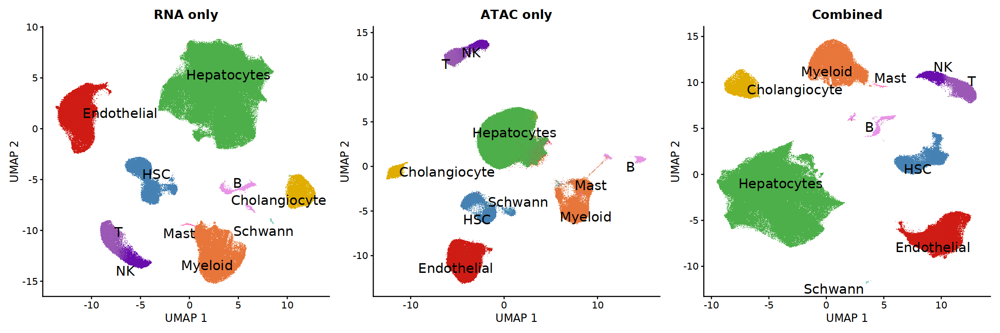

In [51]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata_bp, reduction='umap.rna', group.by='celltype', cols = celltype_colors, label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata_bp, reduction='umap.atac', group.by='celltype', cols = celltype_colors, label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata_bp, reduction='umap.wnn', group.by='celltype', cols = celltype_colors, label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



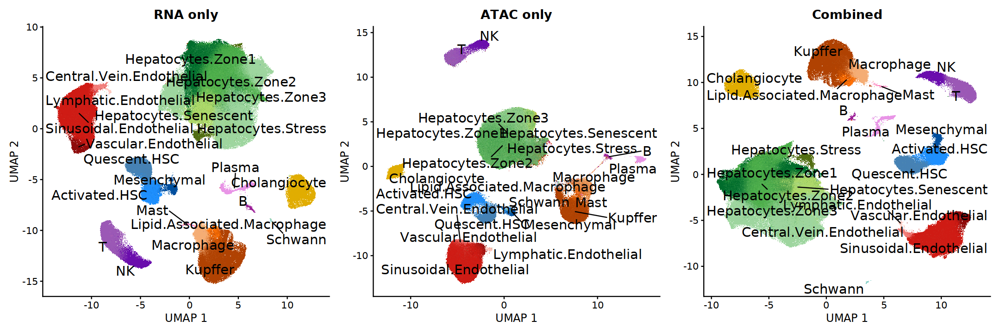

In [52]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata_bp, reduction='umap.rna', group.by='cellsubtype', cols = cellsubtype_colors, label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata_bp, reduction='umap.atac', group.by='cellsubtype', cols = cellsubtype_colors, label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata_bp, reduction='umap.wnn', group.by='cellsubtype', cols = cellsubtype_colors, label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

In [56]:
adata <- readRDS('/nfs/lab/projects/nash_nafld_liver/downstream_all/08272024_fnih_liver_final_object_final_mats_v2.rds')
adata
gc()

An object of class Seurat 
548484 features across 408178 samples within 3 assays 
Active assay: Peaks (488128 features, 0 variable features)
 2 layers present: counts, data
 2 other assays present: RNA, SCT
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,13929000,743.9,20237445,1080.8,20237445,1080.8
Vcells,24493743164,186872.5,45427102918,346581.3,38090678183,290608.9


In [57]:
adata$signac.peaks <- adata$Peaks
DefaultAssay(adata) <- 'RNA'
adata

An object of class Seurat 
1036612 features across 408178 samples within 4 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 3 other assays present: SCT, Peaks, signac.peaks
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

In [58]:
sum(colnames(mat_1) == colnames(mat_2)) == ncol(mat_1)
sum(colnames(mat_3) == colnames(mat_2)) == ncol(mat_3)

[1] TRUE

[1] TRUE

In [59]:
full.mat.1 <- rbind(mat_1, mat_2[1:100000,])
dim(full.mat.1)
head(full.mat.1)

[1] 300000 408178

  [[ suppressing 34 column names 'MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1', 'MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1', 'MM_1341_1_2_MM_1337_1_2_AAACAGCCATCGTTCT-1' ... ]]



6 x 408178 sparse Matrix of class "dgCMatrix"
                                                                              
chr1-9967-10267    . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-16085-16372   . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-17357-17657   . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-29216-29497   . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-102789-103089 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-136647-136947 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
                                 
chr1-9967-10267    . . . . ......
chr1-16085-16372   . . . . ......
chr1-17357-17657   . . . . ......
chr1-29216-29497   . . . . ......
chr1-102789-103089 . . . . ......
chr1-136647-136947 . . . . ......

 .....suppressing 408144 columns in show(); maybe adjust options(max.print=, width=)
 ..............................

In [60]:
full.mat.2 <- rbind(mat_2[100001:200000,], mat_3)
dim(full.mat.2)
head(full.mat.2)

[1] 311576 408178

  [[ suppressing 34 column names 'MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1', 'MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1', 'MM_1341_1_2_MM_1337_1_2_AAACAGCCATCGTTCT-1' ... ]]



6 x 408178 sparse Matrix of class "dgCMatrix"
                                                                              
chr2-120510047-120510347 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr2-120510936-120511220 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr2-120512297-120512597 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr2-120516335-120516635 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr2-120516705-120517005 . . 1 . . . . . . . . . . 1 . . . . 1 . . . . . . . .
chr2-120519461-120519662 . . . . . . . . . . . . . . . . . . . . . . . . . . .
                                             
chr2-120510047-120510347 . . . . . . . ......
chr2-120510936-120511220 . . . . . . . ......
chr2-120512297-120512597 . . . . . . . ......
chr2-120516335-120516635 . . . . . . . ......
chr2-120516705-120517005 . . . . . . . ......
chr2-120519461-120519662 . . . . . . . ......

 .....suppressing 408144 columns in show(); maybe adjust options(max.print=, w

In [61]:
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,13929626,744.0,20237445,1080.8,20237445,1080.8
Vcells,28070141745,214158.2,45427102918,346581.3,38090678183,290608.9


In [62]:
annotations <- GetGRangesFromEnsDb(ensdb=EnsDb.Hsapiens.v86)
seqlevelsStyle(annotations) <- 'UCSC'
genome(annotations) <- 'hg38'

In [63]:
adata$Peaks.1 <- CreateChromatinAssay(counts=full.mat.1[,colnames(adata$RNA$counts)],
                                   min.cells=0, min.features=0, fragments=Fragments(adata$signac.peaks),
                                   sep=c('-', '-'), annotations=annotations, genome='hg38')
adata
adata$Peaks.1

An object of class Seurat 
1336612 features across 408178 samples within 5 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 4 other assays present: SCT, Peaks, signac.peaks, Peaks.1
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

ChromatinAssay data with 300000 features for 408178 cells
Variable features: 0 
Genome: hg38 
Annotation present: FALSE 
Motifs present: FALSE 
Fragment files: 18 

In [64]:
adata$Peaks.2 <- CreateChromatinAssay(counts=full.mat.2[,colnames(adata$RNA$counts)],
                                   min.cells=0, min.features=0, fragments=Fragments(adata$signac.peaks),
                                   sep=c('-', '-'), annotations=annotations, genome='hg38')
adata
adata$Peaks.2

An object of class Seurat 
1648188 features across 408178 samples within 6 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 5 other assays present: SCT, Peaks, signac.peaks, Peaks.1, Peaks.2
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

ChromatinAssay data with 311576 features for 408178 cells
Variable features: 0 
Genome: hg38 
Annotation present: FALSE 
Motifs present: FALSE 
Fragment files: 18 

In [65]:
adata
adata$RNA
adata$SCT
adata$Peaks.1
adata$Peaks.2

An object of class Seurat 
1648188 features across 408178 samples within 6 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 5 other assays present: SCT, Peaks, signac.peaks, Peaks.1, Peaks.2
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

Assay data with 36601 features for 408178 cells
First 10 features:
 MIR1302-2HG, FAM138A, OR4F5, AL627309.1, AL627309.3, AL627309.2,
AL627309.5, AL627309.4, AP006222.2, AL732372.1 

SCTAssay data with 23755 features for 408178 cells, and 1 SCTModel(s) 
Top 10 variable features:
 LDB2, BICC1, PRKG1, LAMA2, ADAMTSL1, LINC02388, NRG3, ST6GALNAC3, HGF,
LIFR 

ChromatinAssay data with 300000 features for 408178 cells
Variable features: 0 
Genome: hg38 
Annotation present: FALSE 
Motifs present: FALSE 
Fragment files: 18 

ChromatinAssay data with 311576 features for 408178 cells
Variable features: 0 
Genome: hg38 
Annotation present: FALSE 
Motifs present: FALSE 
Fragment files: 18 

In [66]:
adata
class(adata$RNA$counts)
class(adata$SCT$counts)
class(adata$Peaks.1$counts)
class(adata$Peaks.2$counts)

An object of class Seurat 
1648188 features across 408178 samples within 6 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 5 other assays present: SCT, Peaks, signac.peaks, Peaks.1, Peaks.2
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

[1] "dgCMatrix"
attr(,"package")
[1] "Matrix"

[1] "dgCMatrix"
attr(,"package")
[1] "Matrix"

[1] "dgCMatrix"
attr(,"package")
[1] "Matrix"

[1] "dgCMatrix"
attr(,"package")
[1] "Matrix"

In [67]:
saveRDS(adata,'/nfs/lab/projects/nash_nafld_liver/downstream_all/10222024_fnih_liver_final_object.rds')

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



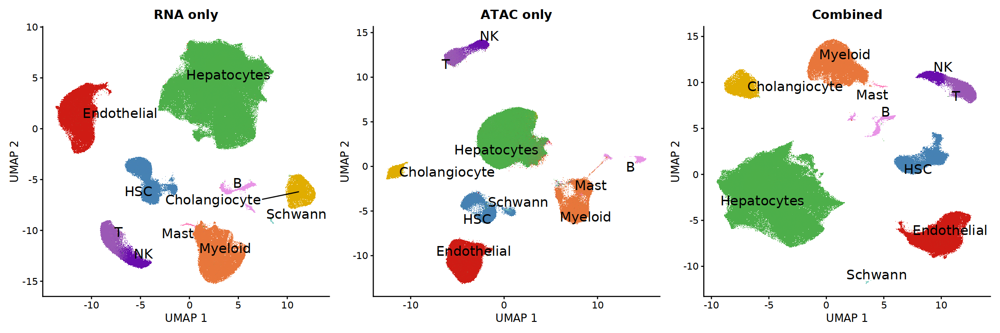

In [13]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='celltype', cols = celltype_colors, label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='celltype', cols = celltype_colors, label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='celltype', cols = celltype_colors, label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

In [16]:
ggsave(p1 + NoLegend(), filename = '/nfs/lab/welison/Liver/Intermediates/241105_WE_Celltype_UMAP.pdf')

Saving 6.67 x 6.67 in image


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



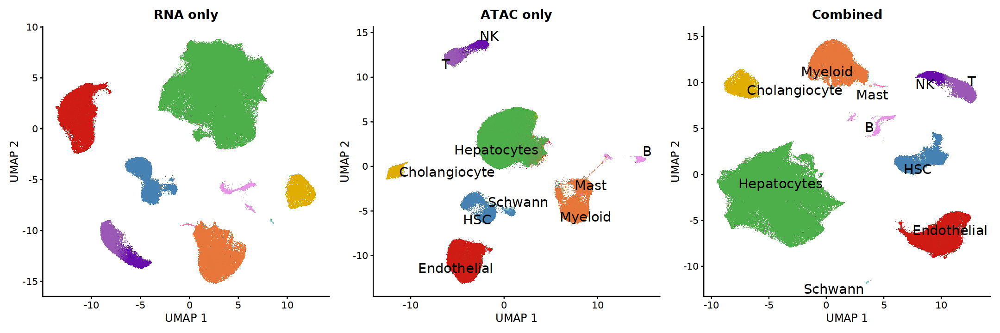

In [11]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='celltype', cols = celltype_colors, label=FALSE, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

In [12]:
ggsave(p1, filename = '/nfs/lab/welison/Liver/Intermediates/241105_WE_Celltype_UMAP_no_label.png')

Saving 6.67 x 6.67 in image


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



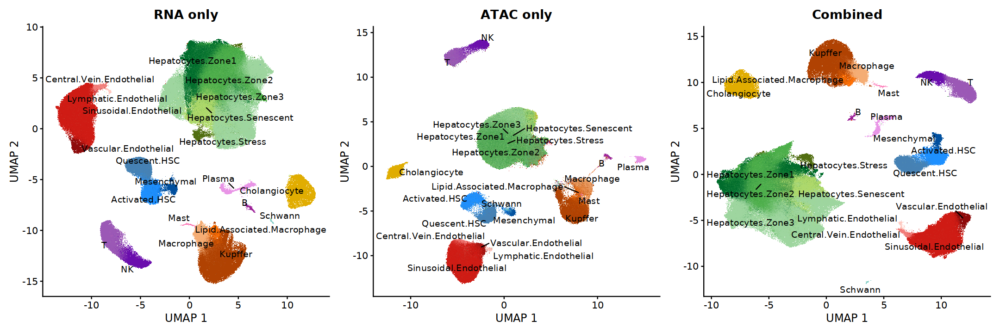

In [9]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='cellsubtype', cols = cellsubtype_colors, label=TRUE, label.size=4, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='cellsubtype', cols = cellsubtype_colors, label=TRUE, label.size=4, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='cellsubtype', cols = cellsubtype_colors, label=TRUE, label.size=4, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

In [12]:
ggsave(p1, filename = '/nfs/lab/welison/Liver/Intermediates/231105_WE_Subtype_UMAP.png')

Saving 6.67 x 6.67 in image


In [ ]:
adata <- NULL
gc()

In [ ]:
adata

In [6]:
adata <- readRDS('/nfs/lab/projects/nash_nafld_liver/downstream_all/10222024_fnih_liver_final_object.rds')
adata

An object of class Seurat 
1648188 features across 408178 samples within 6 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 5 other assays present: SCT, Peaks, signac.peaks, Peaks.1, Peaks.2
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

In [10]:
Fragments(adata$Peaks)

[[1]]
A Fragment object for 36210 cells

[[2]]
A Fragment object for 112633 cells

[[3]]
A Fragment object for 16295 cells

[[4]]
A Fragment object for 16659 cells

[[5]]
A Fragment object for 17361 cells

[[6]]
A Fragment object for 16150 cells

[[7]]
A Fragment object for 16132 cells

[[8]]
A Fragment object for 16501 cells

[[9]]
A Fragment object for 16358 cells

[[10]]
A Fragment object for 16665 cells

[[11]]
A Fragment object for 16168 cells

[[12]]
A Fragment object for 16027 cells

[[13]]
A Fragment object for 15708 cells

[[14]]
A Fragment object for 15812 cells

[[15]]
A Fragment object for 16058 cells

[[16]]
A Fragment object for 15805 cells

[[17]]
A Fragment object for 16115 cells

[[18]]
A Fragment object for 15521 cells


In [17]:
cells(Fragments[[1]])

ERROR: Error in cells(Fragments[[1]]): could not find function "cells"


In [16]:
Fragments(adata$Peaks)[[1]][['path']]

ERROR: Error in Fragments(adata$Peaks)[[1]][["path"]]: this S4 class is not subsettable


In [13]:
for (frag in Fragments(adata$Peaks)) {
    print(frag$path)
}

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'print': $ operator not defined for this S4 class


In [71]:
table(adata[[]][c('library','donor_demux')])

                         donor_demux
library                   HL150001 HL150009 HL150013 HL150015 HL160017 HL160022
  MM_1341_1_2_MM_1337_1_2        0        0        0        0        0        0
  MM_1342_1_2_MM_1338_1_2        0        0        0        0        0        0
  MM_1343_1_2_MM_1339_1_2        0        0        0        0        0        0
  MM_1344_1_2_MM_1340_1_2        0        0        0        0        0        0
  QY_2270_2_QY_2269_2            0        0      263        0        0      302
  QY_2272_2_QY_2271_2            0        0      270        0        0      324
  QY_2274_1_2_QY_2273_1_2        0        0      261        0        0      330
  QY_2276_2_QY_2275_2            0        0      303        0        0      308
  QY_2278_2_QY_2277_2            0        0      278        0        0      352
  QY_2280_2_QY_2279_2            0        0      278        0        0      323
  QY_2282_2_QY_2281_2            0        0      307        0        0      287
  Q

In [72]:
table(adata[[]][c('batch','donor_demux')])

          donor_demux
batch      HL150001 HL150009 HL150013 HL150015 HL160017 HL160022 HL160026
  firstPR         0        0        0        0        0        0        0
  fourthPR        0     3450        0     5568     8822        0     7387
  secondPR        0        0     2231        0        0     2530        0
  thirdPR     10930        0        0        0        0        0        0
          donor_demux
batch      HL160029 HL160030 HL160032 HL160035 HL160037 HL160040 HL160041
  firstPR      1835        0        0        0        0        0        0
  fourthPR        0        0        0        0     3804     8939        0
  secondPR        0     5301        0     4242        0        0        0
  thirdPR         0        0     6512        0        0        0     3611
          donor_demux
batch      HL160042 HL170044 HL170046 HL170047 HL170048 HL170049 HL170052
  firstPR      1495        0     2491        0        0     1742        0
  fourthPR        0        0        0        0

# Make nice plots of UMAP and Features

In [8]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata_bp, reduction='umap.rna', group.by='cellsubtype', cols = cellsubtype_colors, label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata_bp, reduction='umap.atac', group.by='cellsubtype', cols = cellsubtype_colors, label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata_bp, reduction='umap.wnn', group.by='cellsubtype', cols = cellsubtype_colors, label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

ERROR: Error in eval(expr, envir, enclos): object 'adata_bp' not found


In [161]:
adata <- adata_bp

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



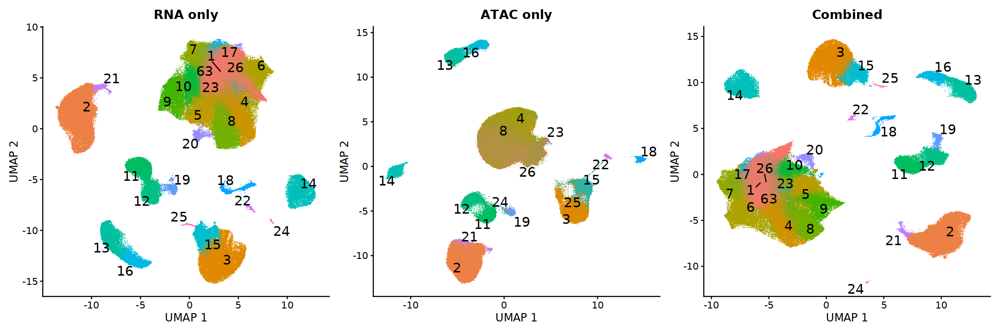

In [162]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='seurat_clusters', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='seurat_clusters', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='seurat_clusters', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



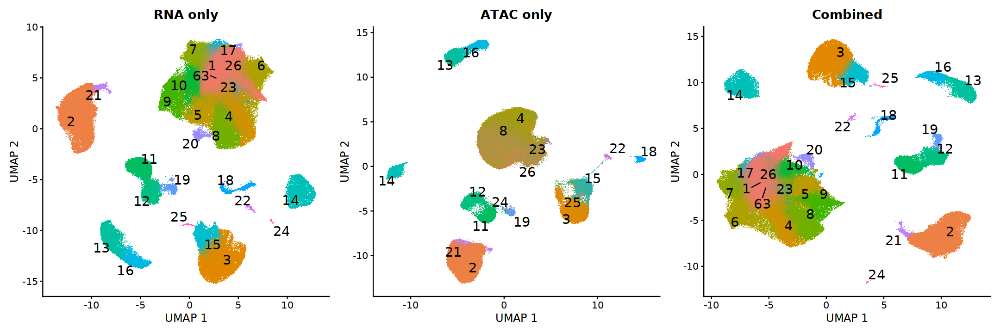

In [7]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='seurat_clusters', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='seurat_clusters', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='seurat_clusters', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

In [163]:
#This is the marker gene list that has 3 each and the additional cell types we discovered last time. 
# reLoad marker list that has additional cell types and compartment 
#CHANGE file name 
# paste means con
cell.markers = read.table("/nfs/lab/scorban/fnih_liver_231110/intregration/assests/Liver.Marker.Gene.List.3only_2.txt", sep = "\t", header = TRUE)
# Make it long, remove useless column and void markers
cell.markers <- cell.markers %>% gather(Key, marker, c(3:ncol(cell.markers)))
cell.markers = cell.markers[,-3]
cell.markers = cell.markers[cell.markers$marker != "", ]


# Factorize columns -- creating an order of the cells for the graphs 
cell.markers$Compartment = factor(cell.markers$Compartment, 
                        levels = c("Liver", "Immune", "Vascular", "Stromal", "Other"))
cell.markers$CellType = factor(cell.markers$CellType,
                        levels = c("Hepatoblasts", "Hepatocyte", "Cholangiocyte", "Hepatic_stellate_cell", "Kupffer_cell", 
                                   "Macrophage", "Myeloid", "B_cell", "Mast", "DC", "Plasma", "T_cell-NK", "T_cell", "NK", 
                                   "Endothelial", "Lymph-Endo", 
                                   "Fibroblast", "Adipocyte", "Myofibroblast", 
                                   "Erythrocytes"))

cell.compartment = cell.markers[,-3]

In [183]:
cell.markers

,Compartment,CellType,marker
,<fct>,<fct>,<chr>
1,Immune,T_cell,CD69
2,Immune,T_cell-NK,THEMIS
3,Immune,B_cell,IGKC
4,Immune,Myeloid,C1QA
5,Immune,Macrophage,CD4
6,Immune,NK,NKG7
7,Immune,Mast,KIT
8,Immune,DC,HLA-DPB1
9,Immune,Plasma,MZB1


In [195]:
canonical.markers.TK <- c('EPCAM','SYR','SOX9','KRT19','KRT7', 'KRT1','ANXA4','CDH1','ITGB1','LCN2','HES1','CFTR','SOX4', #Cholangiocytes
                         'PECAM', 'CD34', 'PTPRC', 'MCAM', 'FCGR2B', 'LYVE1','STAB2','VWF',  #Endo, Up to MCAM are hallmark
                         'ADGRE1', 'CD68', 'MYB', 'MAF', 'CXCR1', 'CSFR1', 'ITGAM', 'VSIG4', 'GAT2', 'CCR2', 'FLT3') #Macro: Tissue up to VSIG4 the marrow derived)

ANXA4, STAB2, VWF, VSIG4

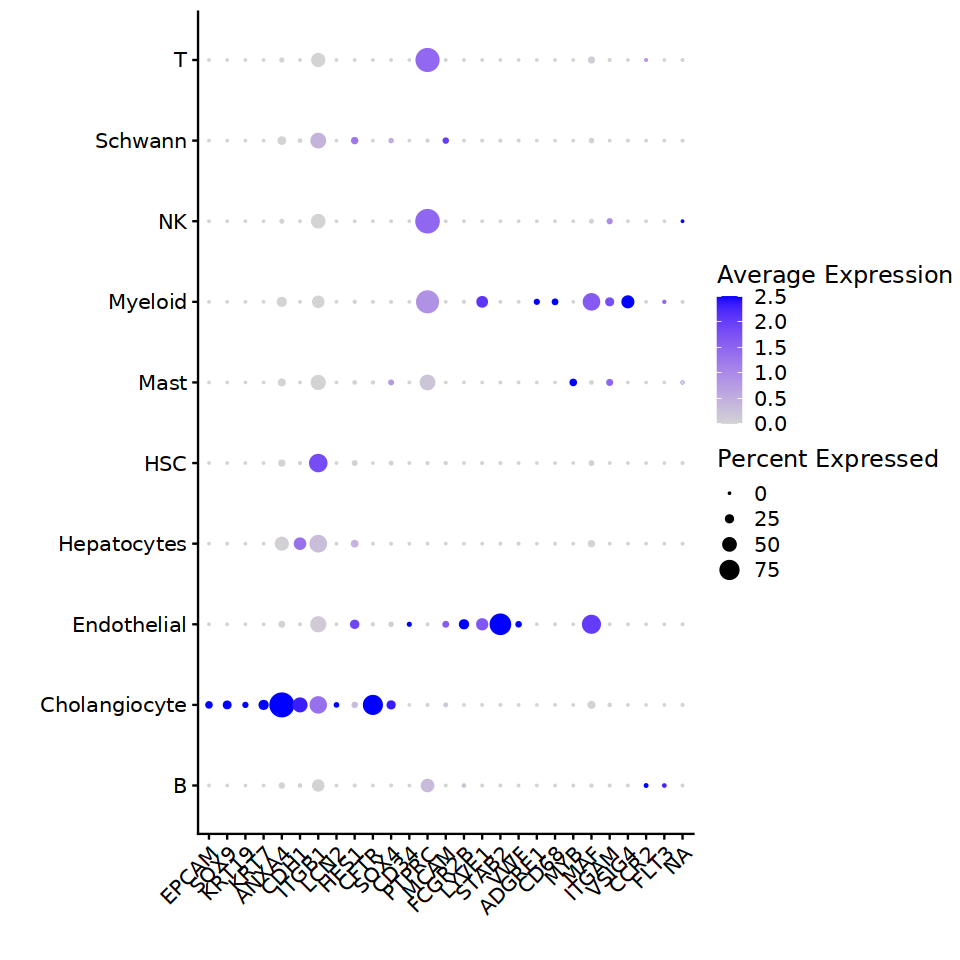

In [203]:
g = DotPlot(adata, assay='SCT', features=canonical.markers.TK, cluster.idents=FALSE, col.min=0, group.by = 'celltype') +
        theme(axis.text.x=element_text(angle=45, hjust=1)) + xlab('') + ylab('')
g

In [219]:
adata$celltype.order <- factor(adata$celltype, levels=rev(c('Hepatocytes','Endothelial','Cholangiocyte','HSC','Myeloid','T','NK','B','Mast','Schwann')))

In [221]:
unique(adata$celltype.order)

[1] Endothelial   Hepatocytes   T             HSC           Cholangiocyte
 [6] Myeloid       Schwann       NK            B             Mast         
10 Levels: Schwann Mast B NK T Myeloid HSC Cholangiocyte ... Hepatocytes

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


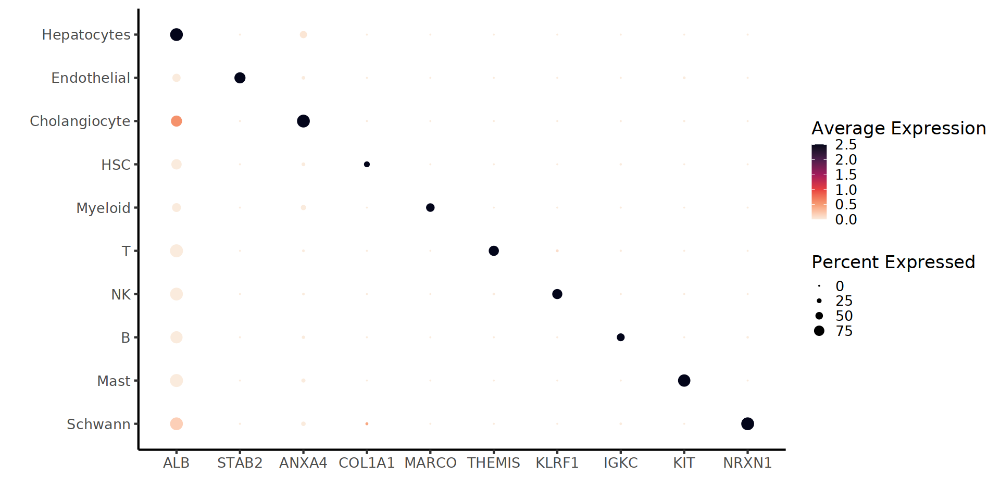

In [226]:
options(repr.plot.width=16, repr.plot.height=8)
final.markers <- c('ALB','STAB2','ANXA4','COL1A1','MARCO','THEMIS','KLRF1','IGKC','KIT','NRXN1')
#VSIG4 is CRIg

g = DotPlot(adata, assay='SCT', features=final.markers, cluster.idents=FALSE, col.min=0, group.by = 'celltype.order') +
        theme( axis.text.x=element_text(angle=45, hjust=1)) + xlab('') + ylab('') + 
    theme_classic(base_size=20)+ scale_colour_viridis_c(option='rocket', direction=-1)
g

In [ ]:
options(repr.plot.width=16, repr.plot.height=8)
final.markers <- c('ALB','STAB2','ANXA4','COL1A1','MARCO','THEMIS','KLRF1','IGKC','KIT','NRXN1')
#VSIG4 is CRIg

g = DotPlot(adata, assay='SCT', features=final.markers, cluster.idents=FALSE, col.min=0, group.by = 'celltype.order') +
        theme( axis.text.x=element_text(angle=45, hjust=1)) + xlab('') + ylab('') + 
    theme_classic(base_size=20)+ scale_colour_viridis_c(option='rocket', direction=-1)
g

In [13]:
unique(adata$cellsubtype)

[1] "Sinusoidal.Endothelial"      "Hepatocytes.Zone2"          
 [3] "Hepatocytes.Zone3"           "Vascular.Endothelial"       
 [5] "Hepatocytes.Senescent"       "T"                          
 [7] "Hepatocytes.Zone1"           "Quescent.HSC"               
 [9] "Mesenchymal"                 "Cholangiocyte"              
[11] "Kupffer"                     "Activated.HSC"              
[13] "Schwann"                     "Hepatocytes.Stress"         
[15] "Macrophage"                  "Central.Vein.Endothelial"   
[17] "Lymphatic.Endothelial"       "NK"                         
[19] "Lipid.Associated.Macrophage" "Plasma"                     
[21] "B"                           "Mast"

In [7]:
adata$cellsubtype.order <- factor(adata$cellsubtype, 
                                  levels=rev(c('Hepatocytes.Zone1', 'Hepatocytes.Zone2', 'Hepatocytes.Zone3', 'Hepatocytes.Senescent', 'Hepatocytes.Stress', 
                                               'Central.Vein.Endothelial', 'Sinusoidal.Endothelial', 'Vascular.Endothelial', 'Lymphatic.Endothelial',
                                               'Cholangiocyte', 'Quescent.HSC', 'Activated.HSC', 'Mesenchymal', 
                                               'Kupffer', 'Macrophage', 'Lipid.Associated.Macrophage', 'T', 
                                               'NK', 'Plasma', 'B', 'Mast', 'Schwann')))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


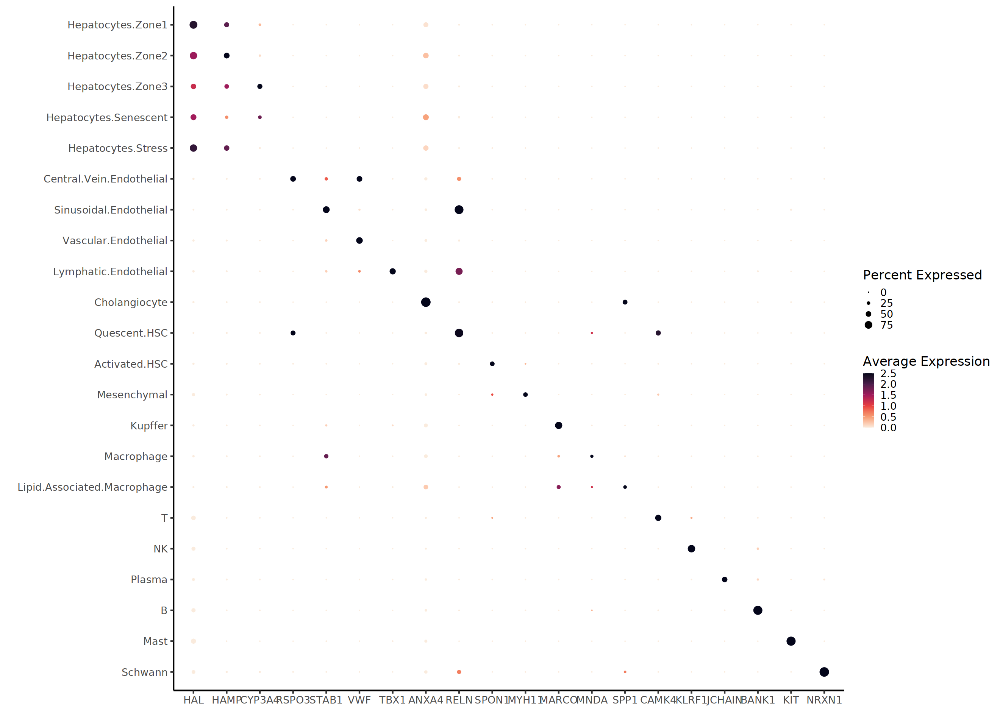

In [10]:
options(repr.plot.width=22, repr.plot.height=16)
final.markers <- c('HAL','HAMP','CYP3A4', #all Hepato except senescent
                   'RSPO3','STAB1','VWF','TBX1', #Endothelial
                   'ANXA4', #cholangio
                   'RELN','SPON1','MYH11', #HSC #EBF1
                  'MARCO','MNDA','SPP1', #Macro
                   'CAMK4','KLRF1', # NK, T
                  'JCHAIN','BANK1', # B
                  'KIT','NRXN1')
#VSIG4 is CRIg

g = DotPlot(adata, assay='SCT', features=final.markers, cluster.idents=FALSE, col.min=0, group.by = 'cellsubtype.order') +
        theme( axis.text.x=element_text(angle=45, hjust=1)) + xlab('') + ylab('') + 
    theme_classic(base_size=20)+ scale_colour_viridis_c(option='rocket', direction=-1)
g

In [ ]:
adata$cellsubtype

In [ ]:
adata

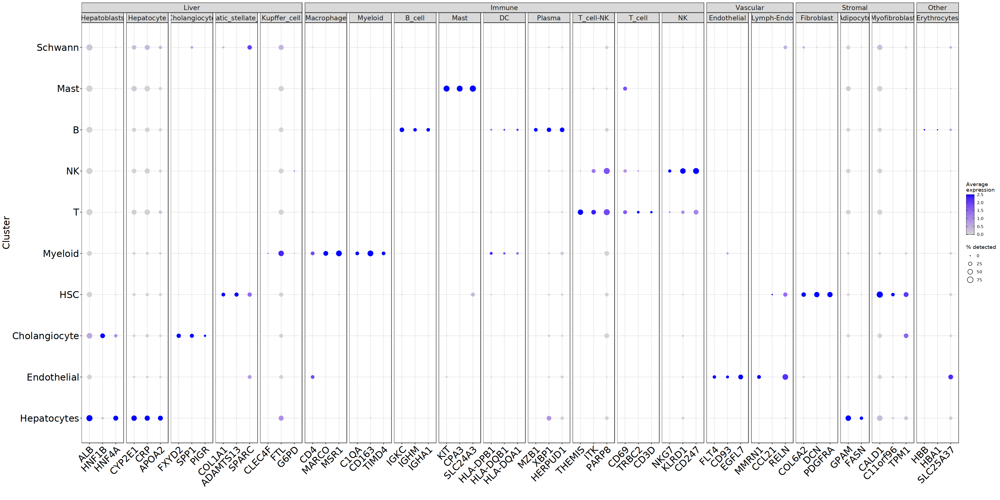

In [213]:
#Making a dot plot with cell type markers. We will use this to not only assign cell types, but also narrow down the markers, since I have too many liver marker genes.
#Change width and height, since I'll have so many markers to visualize. (previous width/height was 25/10).
g = DotPlot(adata, assay='SCT', features=cell.markers$marker, cluster.idents=FALSE, col.min=0, group.by = 'celltype.order') +
        theme(axis.text.x=element_text(angle=45, hjust=1)) + xlab('') + ylab('')
    meta_summary = g$data
    colnames(meta_summary)[3] = "marker"
    meta_summary = merge(meta_summary, cell.markers, by = "marker")

    options(repr.plot.width=30, repr.plot.height=15)
    figure <- ggplot(meta_summary, aes(x = marker, y = id)) +
      geom_point(aes(size = pct.exp, fill = avg.exp.scaled, stroke=NA),
                 shape = 21) +
      scale_size("% detected", range = c(0, 6)) +
      scale_fill_gradient(low = "lightgray", high = "blue",
                           guide = guide_colorbar(nbin = 200,
                                                  ticks.colour = "black", frame.colour = "black"),
                           name = "Average\nexpression") +
      ylab("Cluster") + xlab("") +
      theme_bw() +
      theme(axis.text = element_text(size = 100),
            axis.text.x = element_text(size = 20, angle = 45, hjust = 1, color = "black"),
            strip.text.x = element_text(size = 14),
            axis.text.y = element_text(size = 20, color = "black"),
            axis.title = element_text(size = 20)) +
      ggh4x::facet_nested(cols = vars(Compartment, CellType), scales = "free", space = "free")
figure

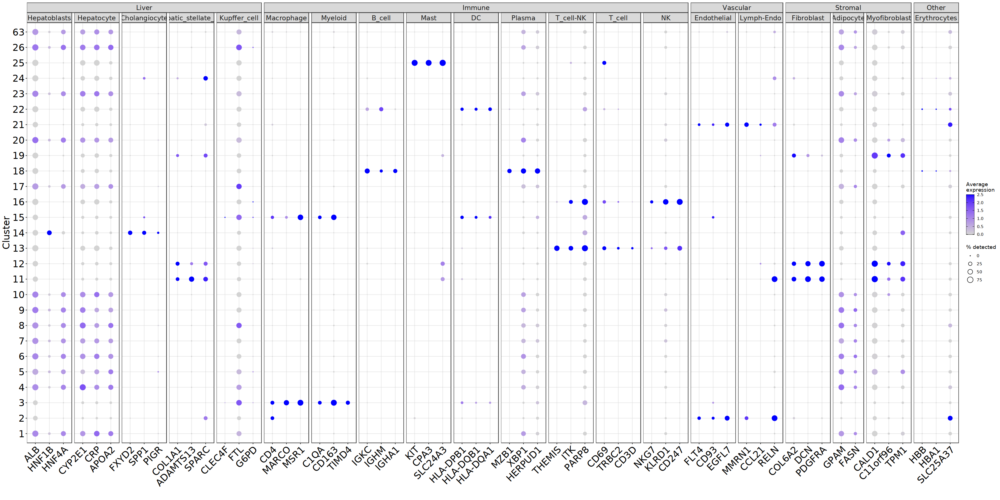

In [206]:
#Making a dot plot with cell type markers. We will use this to not only assign cell types, but also narrow down the markers, since I have too many liver marker genes.
#Change width and height, since I'll have so many markers to visualize. (previous width/height was 25/10).
g = DotPlot(adata, assay='SCT', features=cell.markers$marker, cluster.idents=FALSE, col.min=0) +
        theme(axis.text.x=element_text(angle=45, hjust=1)) + xlab('') + ylab('')
    meta_summary = g$data
    colnames(meta_summary)[3] = "marker"
    meta_summary = merge(meta_summary, cell.markers, by = "marker")

    options(repr.plot.width=30, repr.plot.height=15)
    figure <- ggplot(meta_summary, aes(x = marker, y = id)) +
      geom_point(aes(size = pct.exp, fill = avg.exp.scaled, stroke=NA),
                 shape = 21) +
      scale_size("% detected", range = c(0, 6)) +
      scale_fill_gradient(low = "lightgray", high = "blue",
                           guide = guide_colorbar(nbin = 200,
                                                  ticks.colour = "black", frame.colour = "black"),
                           name = "Average\nexpression") +
      ylab("Cluster") + xlab("") +
      theme_bw() +
      theme(axis.text = element_text(size = 100),
            axis.text.x = element_text(size = 20, angle = 45, hjust = 1, color = "black"),
            strip.text.x = element_text(size = 14),
            axis.text.y = element_text(size = 20, color = "black"),
            axis.title = element_text(size = 20)) +
      ggh4x::facet_nested(cols = vars(Compartment, CellType), scales = "free", space = "free")
figure

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


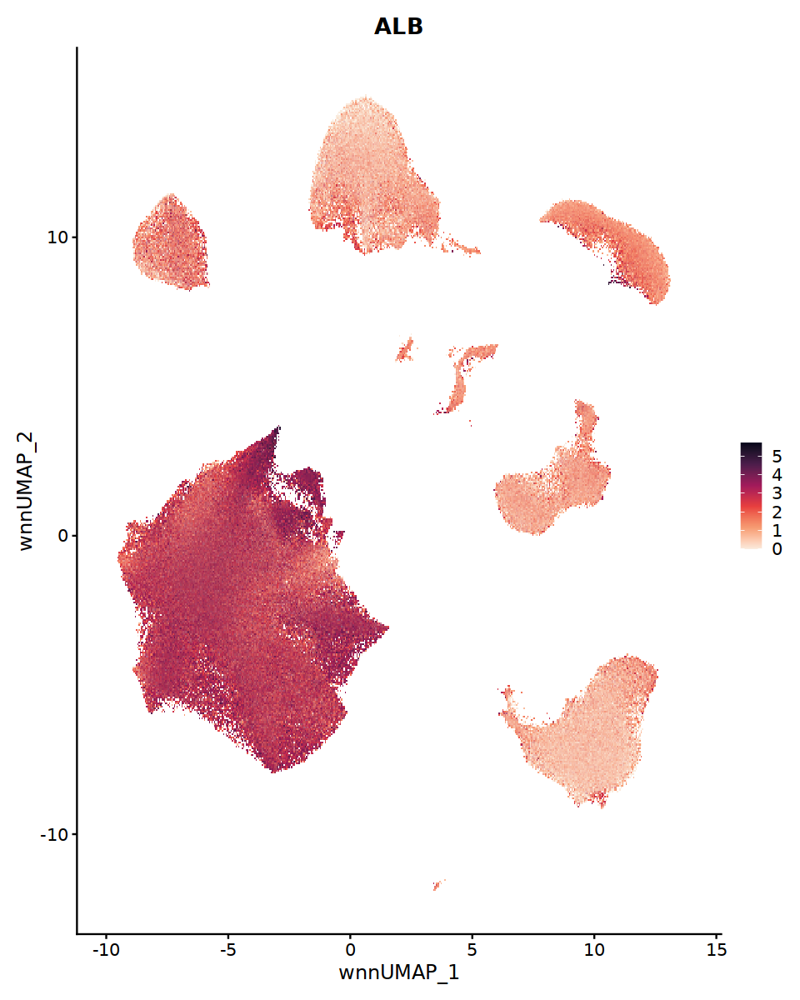

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


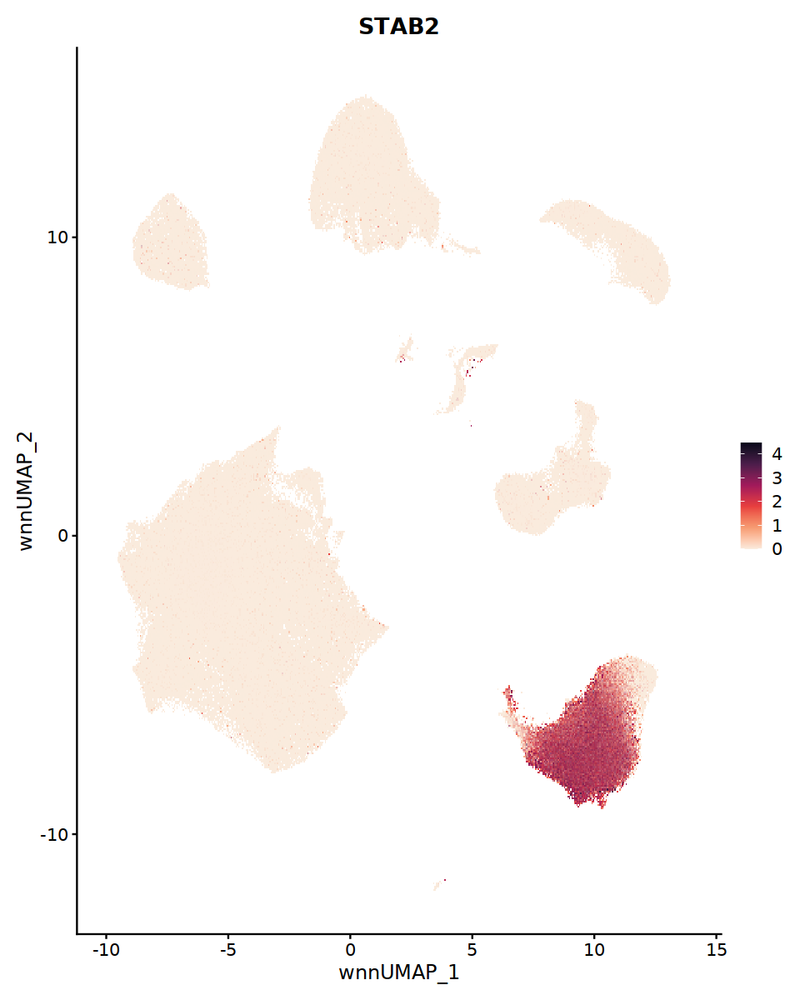

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


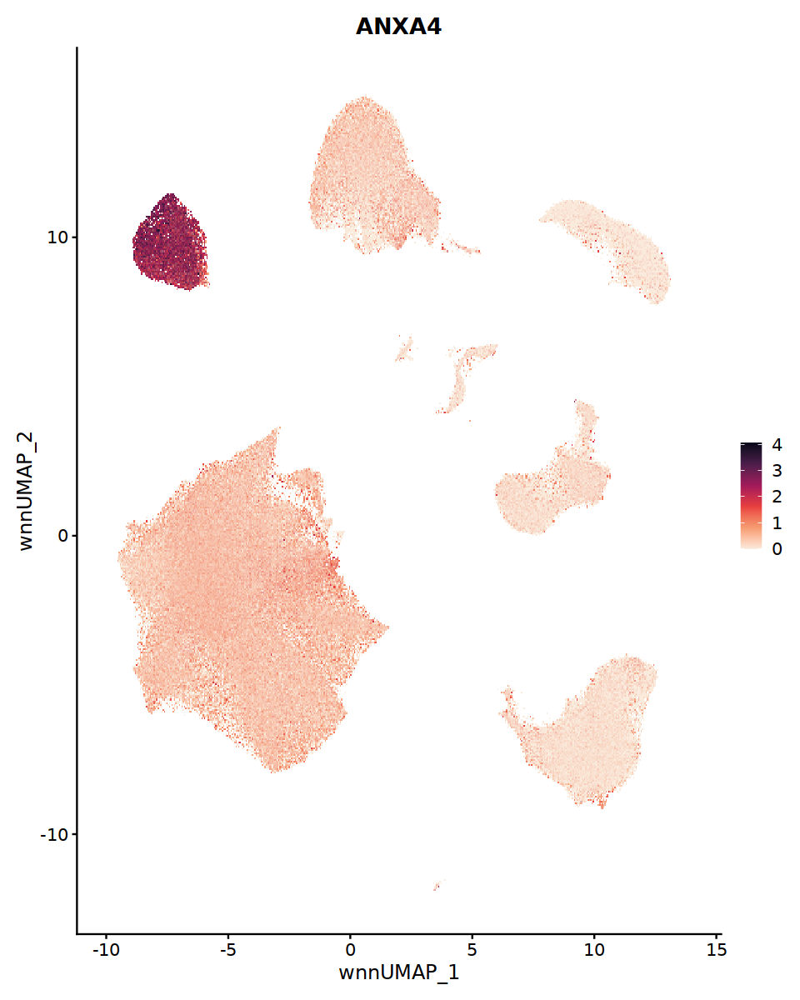

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


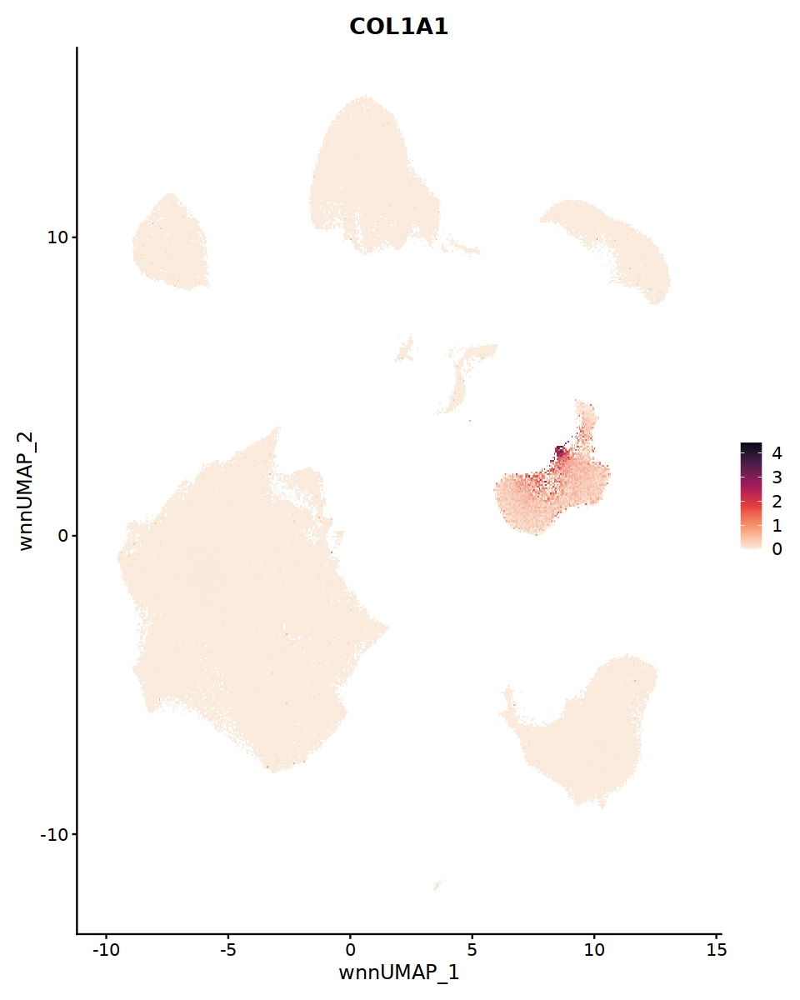

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


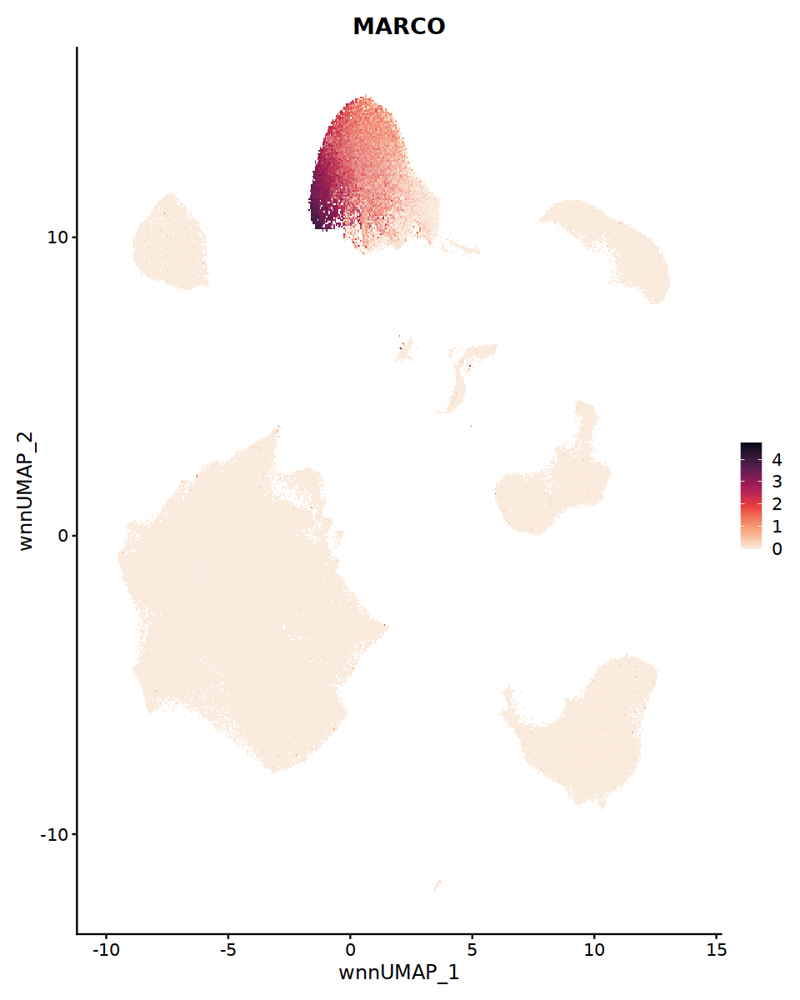

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


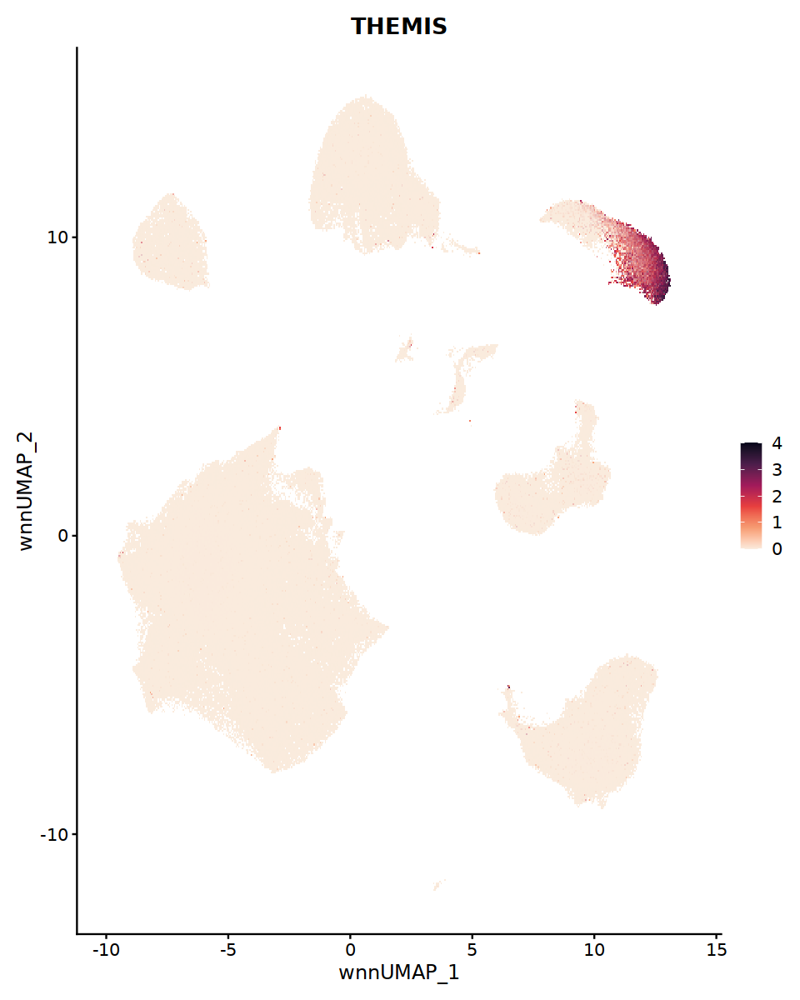

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


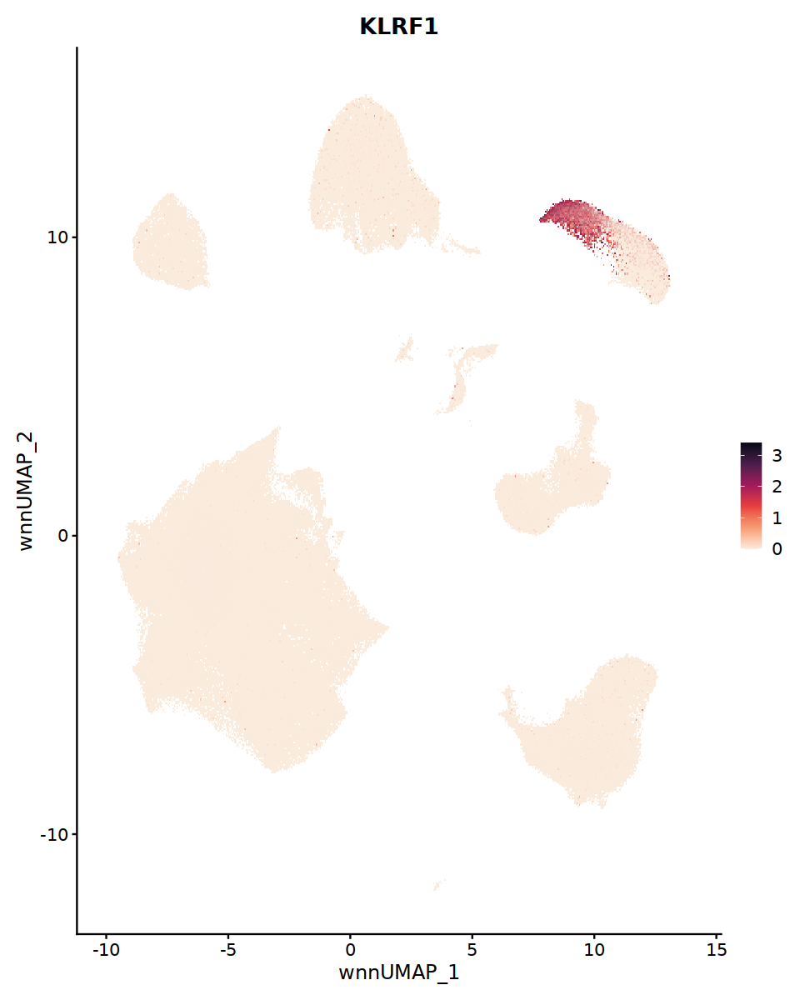

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


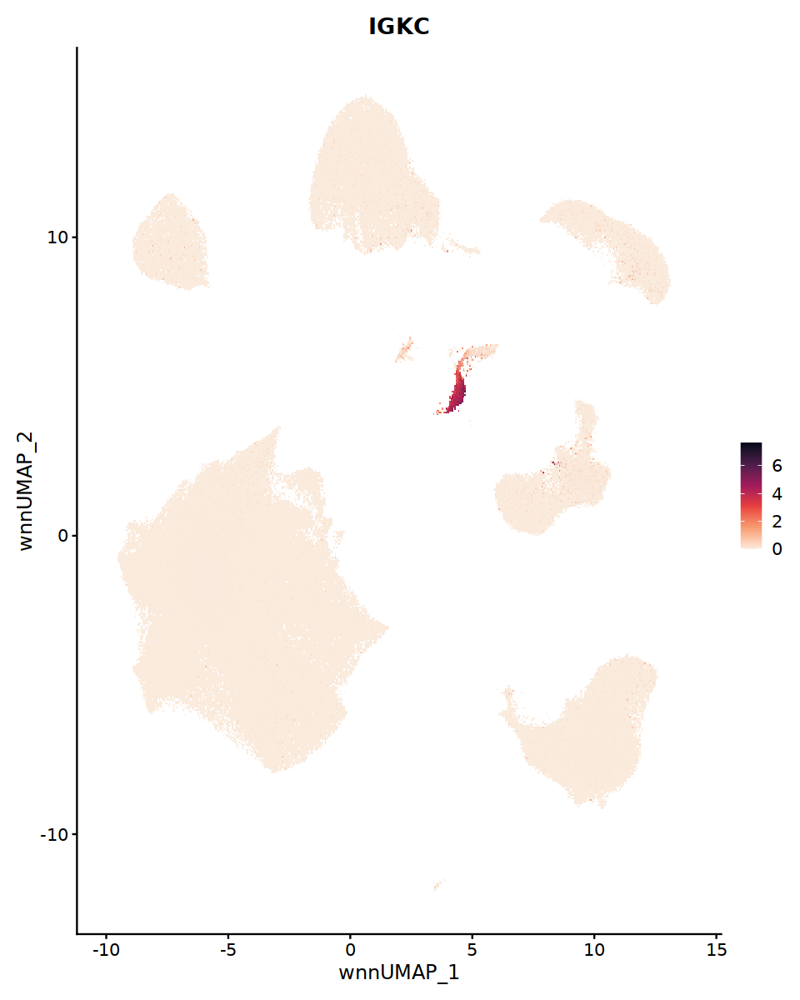

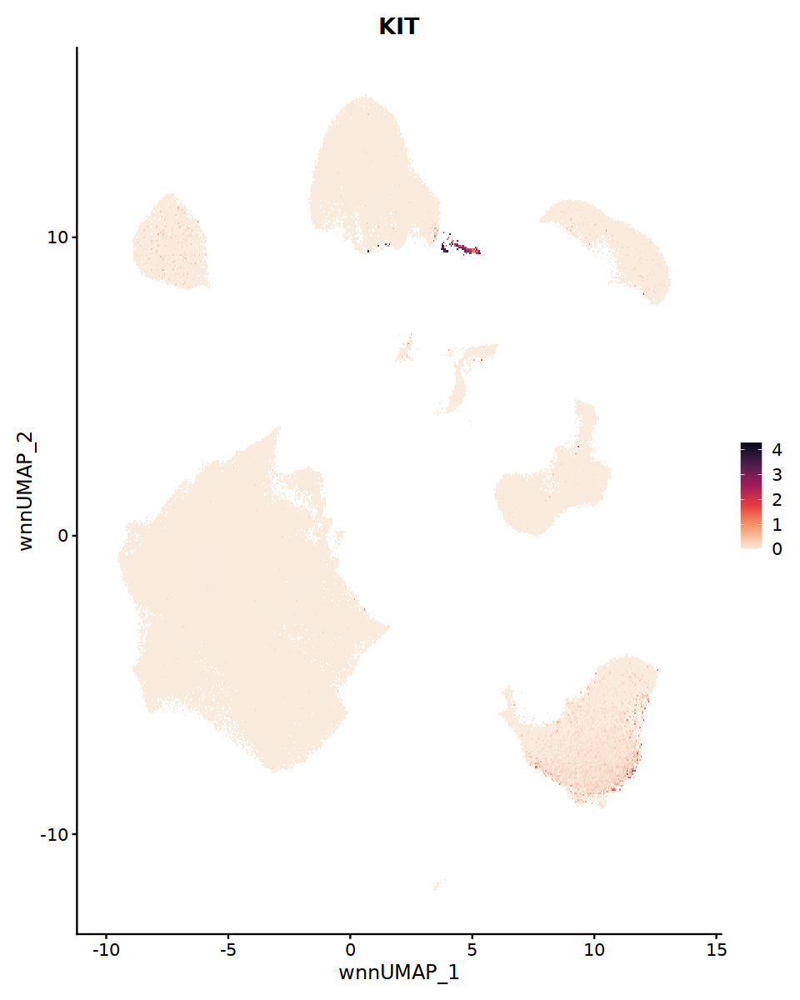

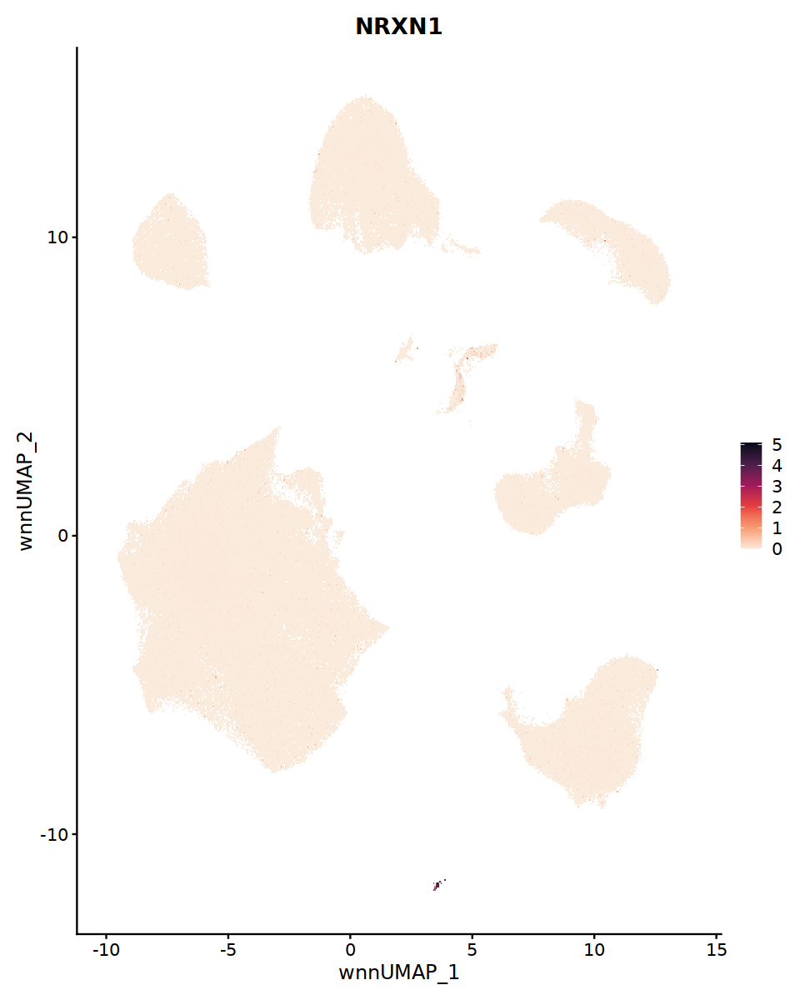

In [234]:
options(repr.plot.width=8, repr.plot.height=10)
DefaultAssay(adata) <- 'SCT'

for (marker in final.markers) {
    p1 <- FeaturePlot(
      object = adata,
      reduction = "umap.wnn",
      features = marker,
      raster=TRUE
    ) + scale_colour_viridis_c(option='rocket', direction=-1)
    print(p1)
}

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


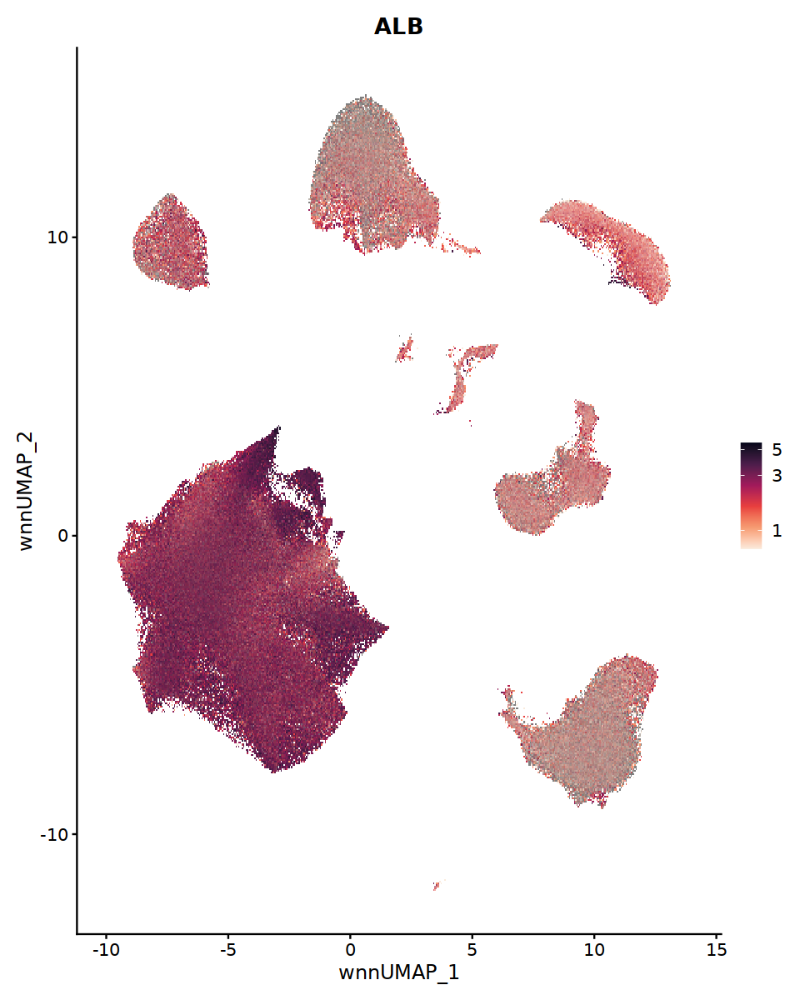

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


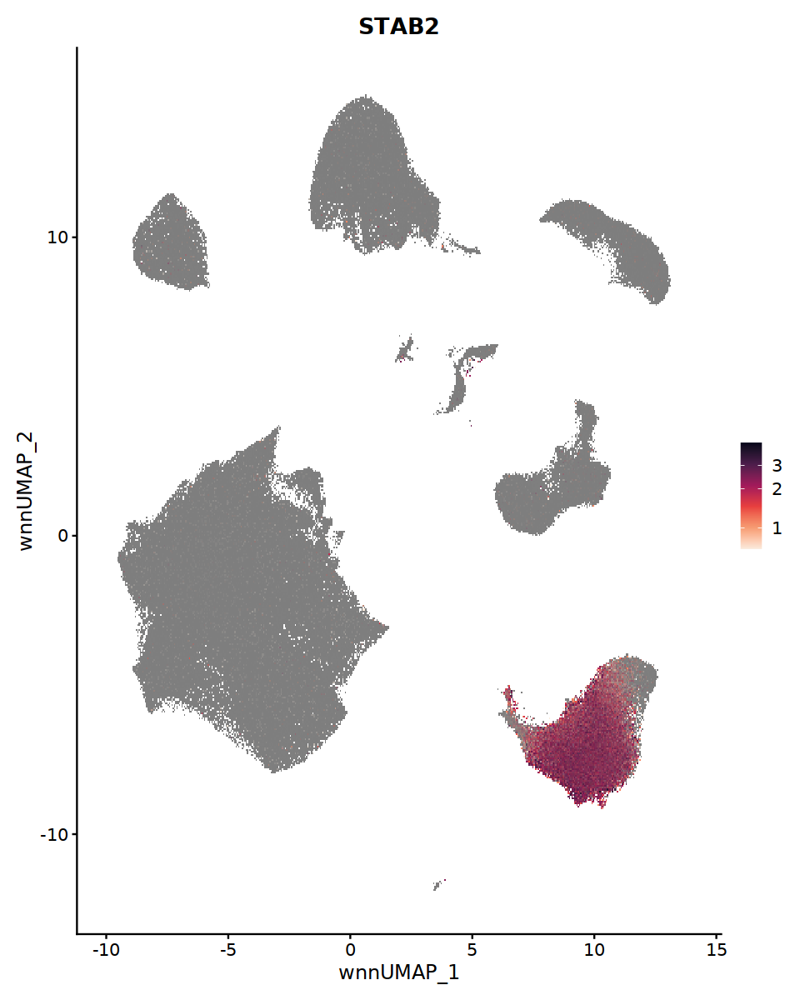

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


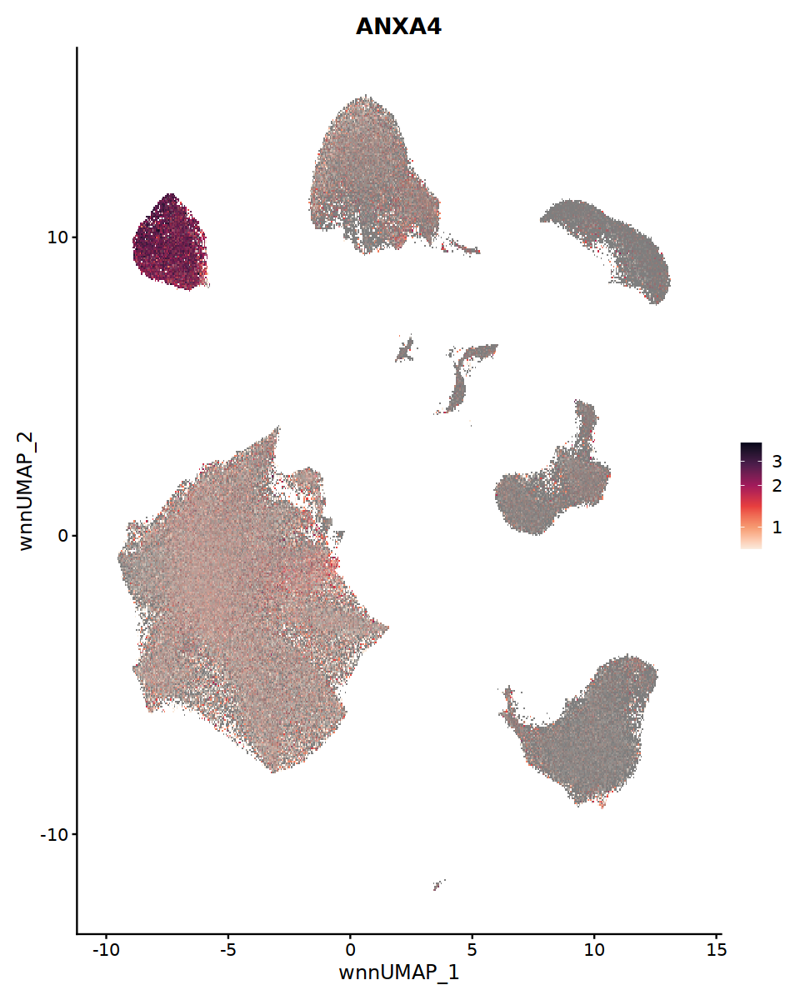

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


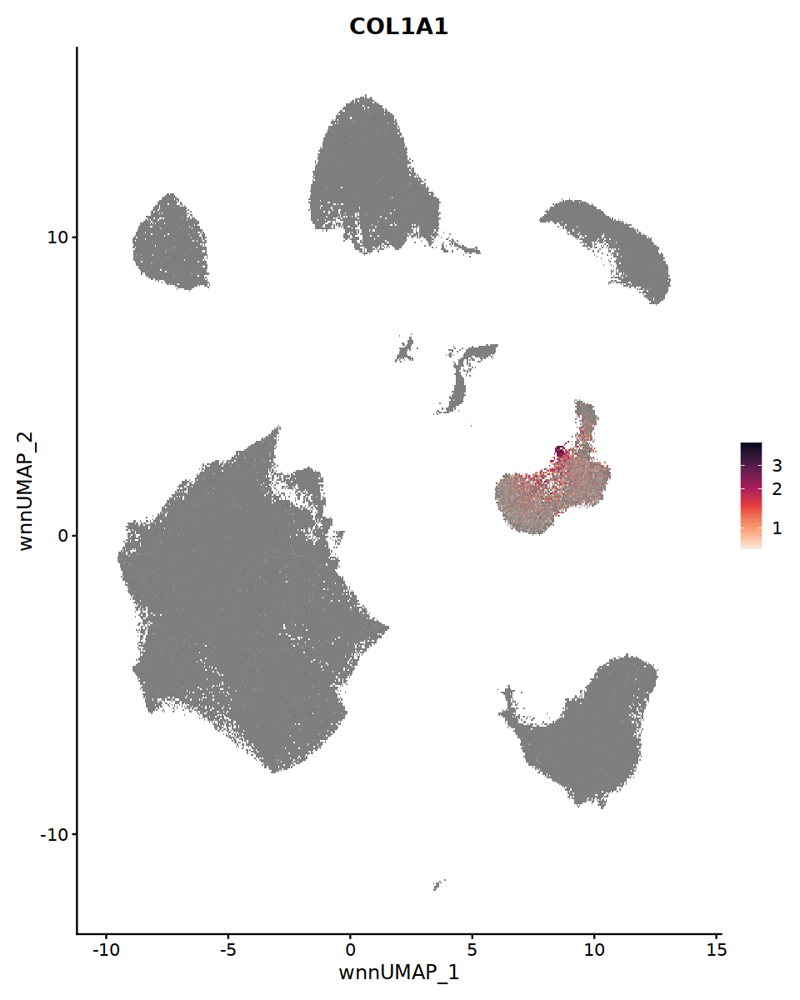

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


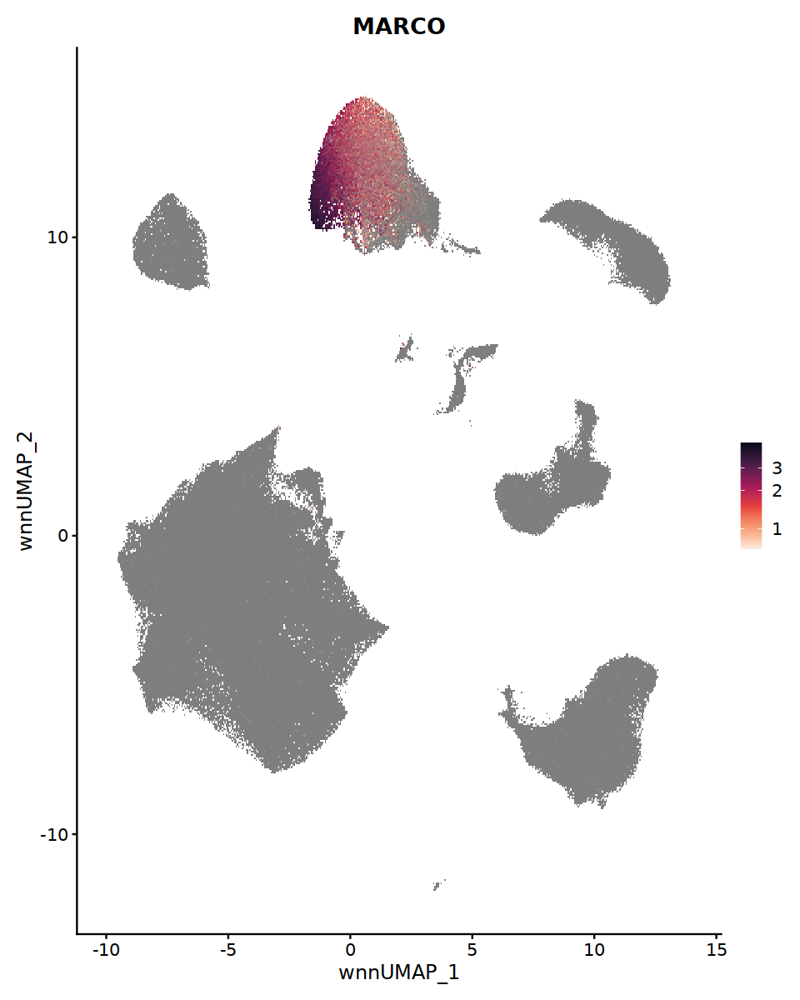

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


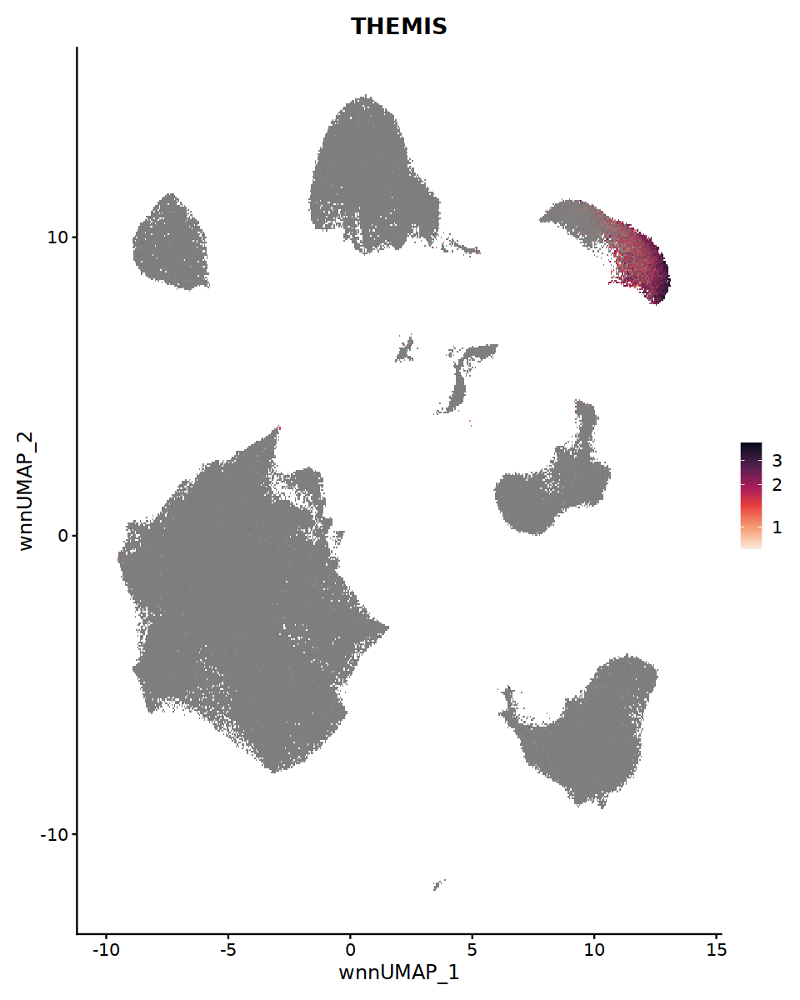

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


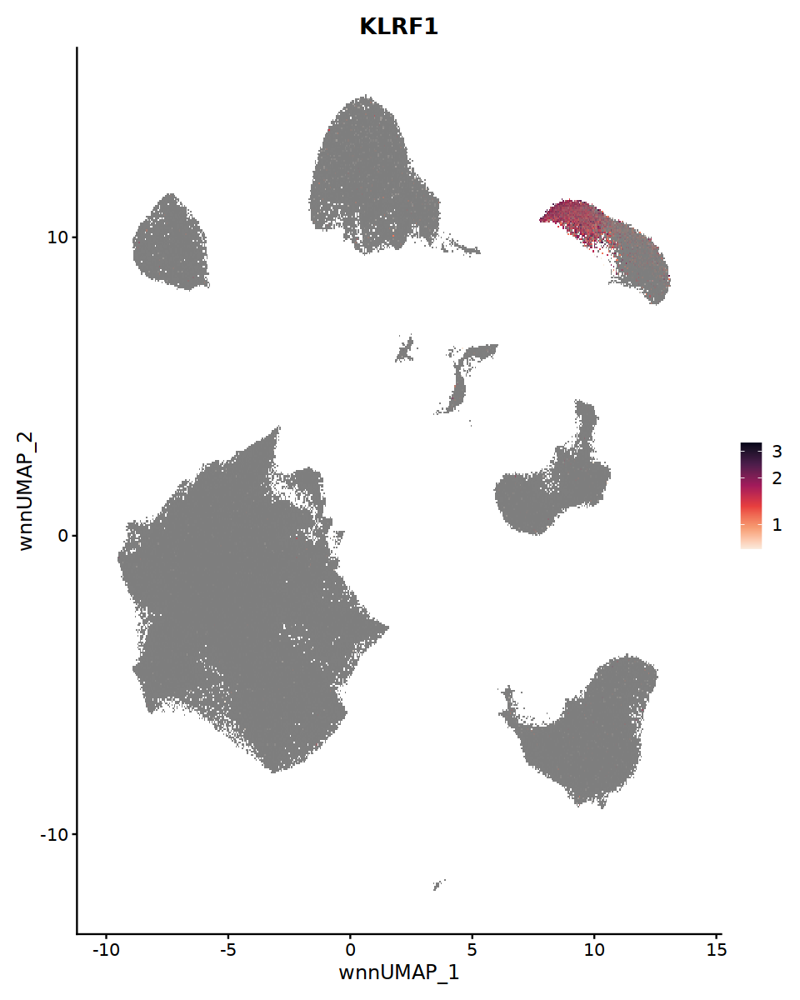

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


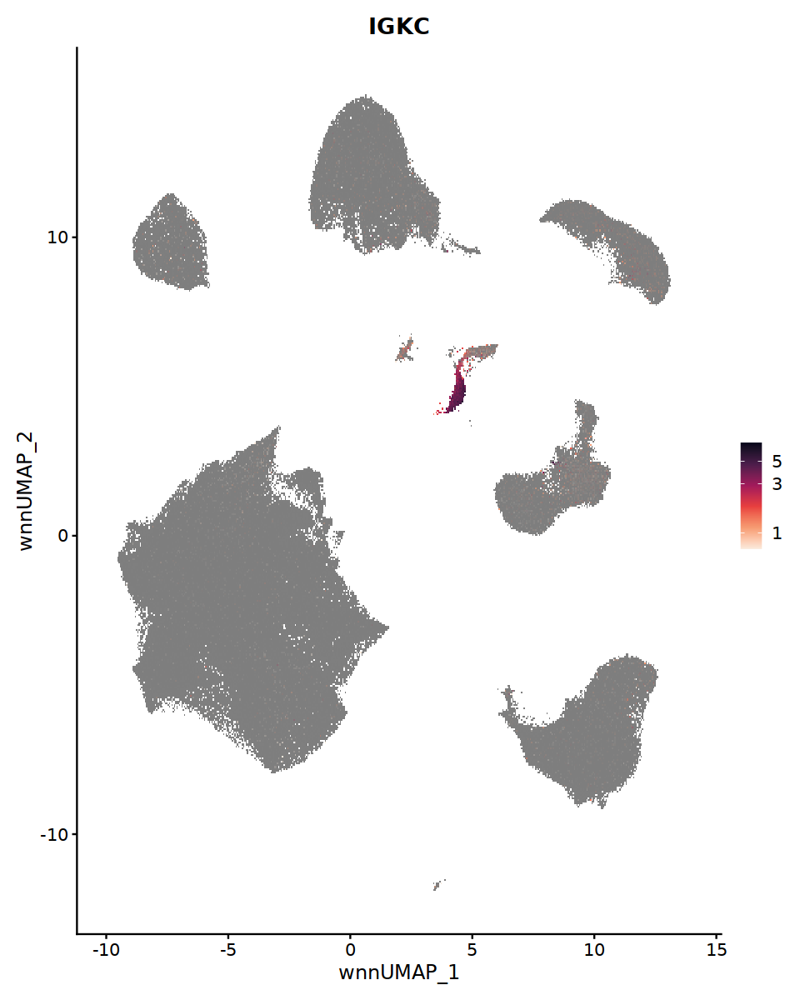

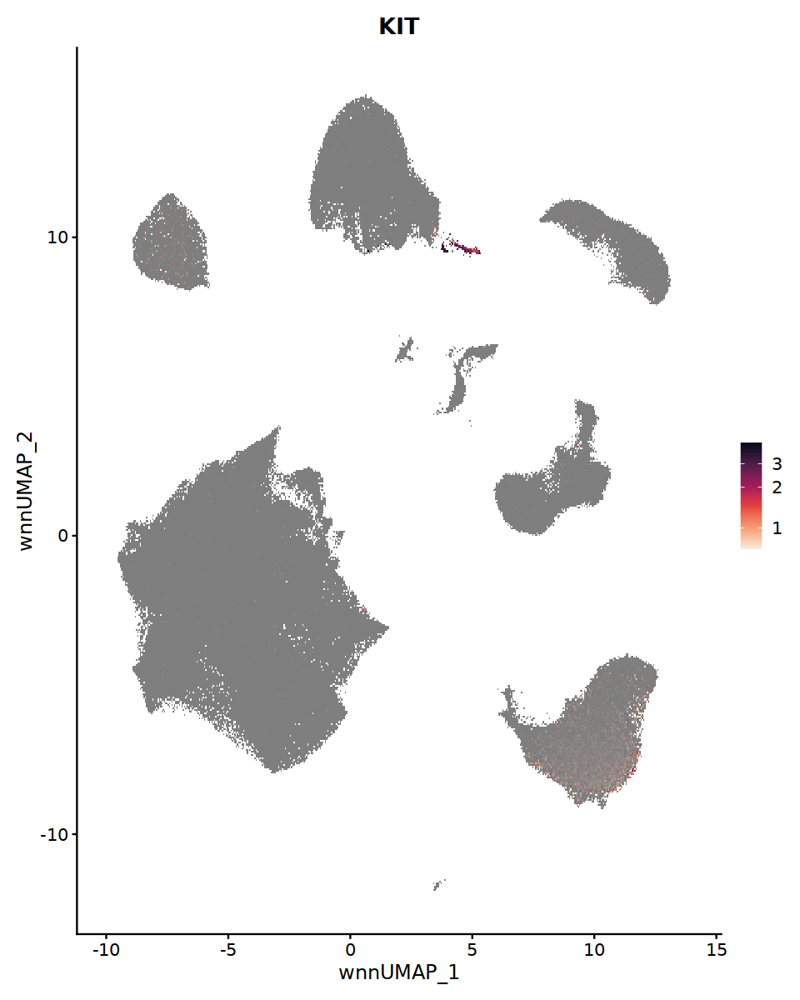

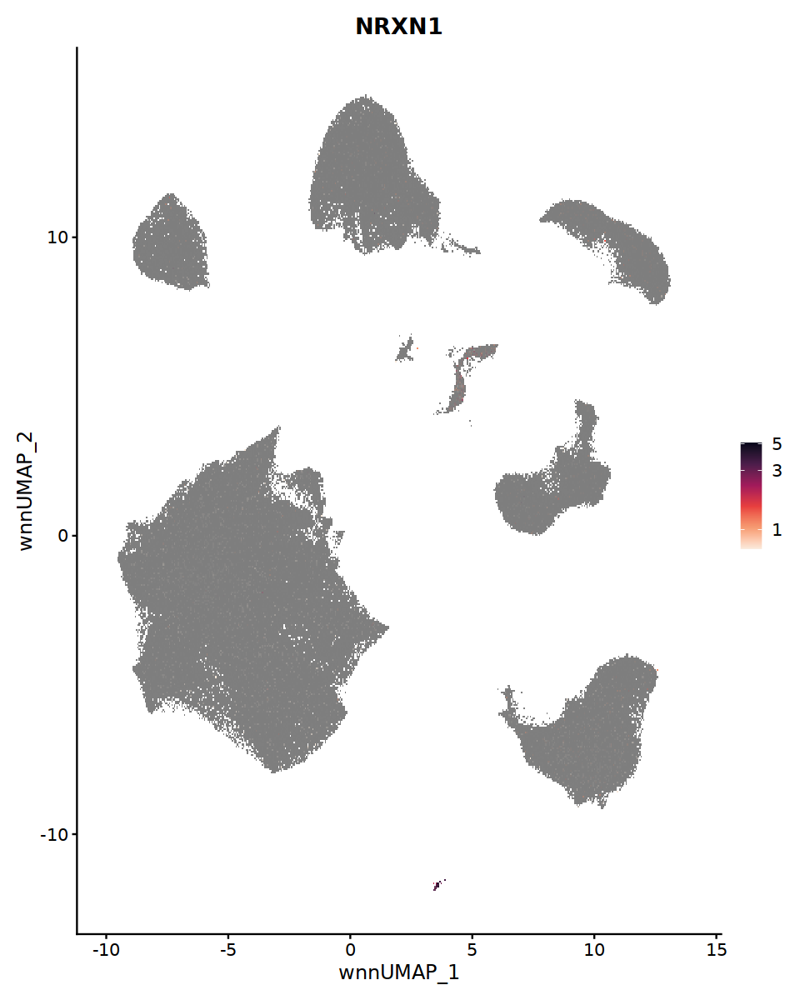

In [235]:
options(repr.plot.width=8, repr.plot.height=10)
DefaultAssay(adata) <- 'SCT'

for (marker in final.markers) {
    p1 <- FeaturePlot(
      object = adata,
      reduction = "umap.wnn",
      features = marker,
      raster=TRUE
    ) + scale_colour_viridis_c(option='rocket', direction=-1, trans='log10')
    print(p1)
}

In [232]:
#creating a table that has lane, sample, condition info all in one. Split by batch
cell.sample = as.data.frame(table(adata$donor_demux, adata$lane, adata$batch, adata$condition))
colnames(cell.sample)[1] = "donor"
colnames(cell.sample)[2] = "lane"
colnames(cell.sample)[3] = "batch"
colnames(cell.sample)[4] = "condition"
cell.sample = dplyr::filter(cell.sample, Freq != 0)

In [237]:
#using the above table to create a plot that shows you condition by lane, split by batch 
#CHANGE lane/lib and chamber/batch 
width = 0.8
gg1 = ggplot(cell.sample, aes(x= lane, y = Freq, fill = condition, label = Freq)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("Cell #: ", length(colnames(adata[["RNA"]])))) +
            geom_bar(stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip() +
            ggh4x::facet_nested(rows = vars(batch), scales = "free", space = "free")

gg2 = ggplot(cell.sample, aes(x= lane, y = Freq, fill = condition, label = Freq)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("Cell proportion")) +
            geom_bar(position = position_fill(reverse = FALSE), stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                  axis.text.y = element_blank(),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip() +
            ggh4x::facet_nested(rows = vars(batch), scales = "free", space = "free")

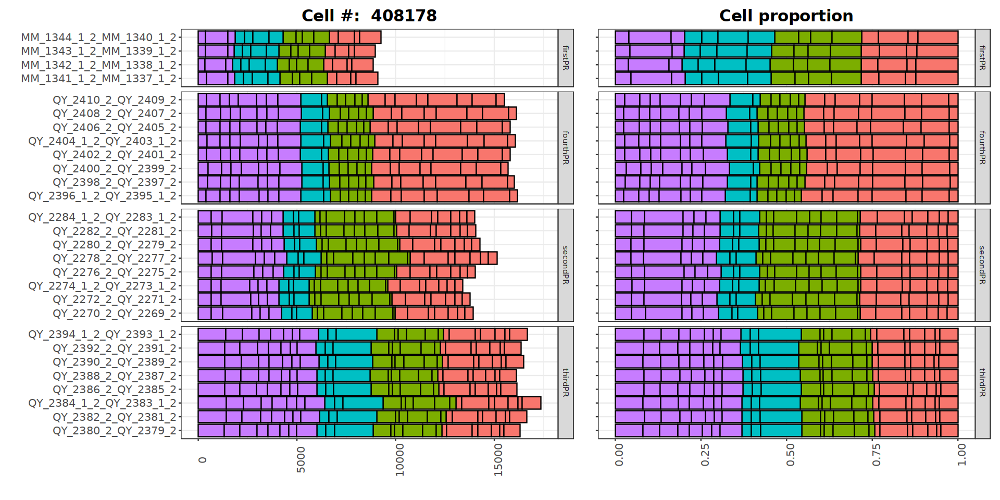

In [238]:
#creating the plots 
options(repr.plot.width=16, repr.plot.height=8)
gg1 + gg2 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



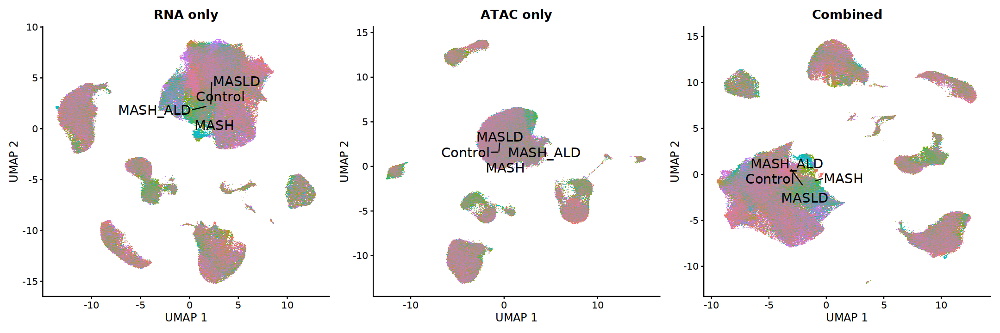

In [239]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='condition', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='condition', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='condition', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



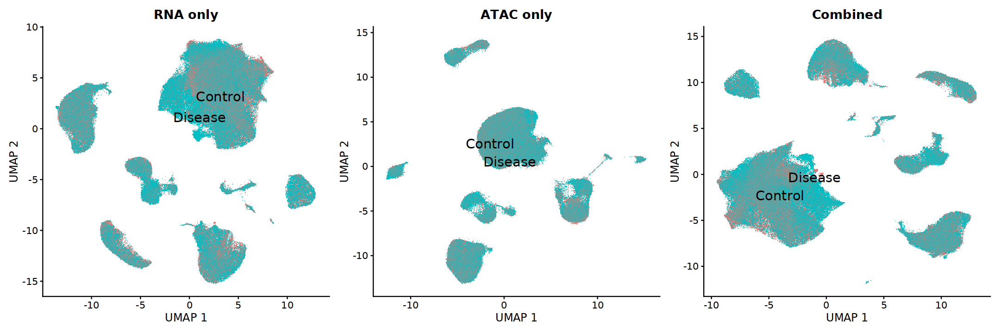

In [240]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='disease_status', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='disease_status', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='disease_status', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



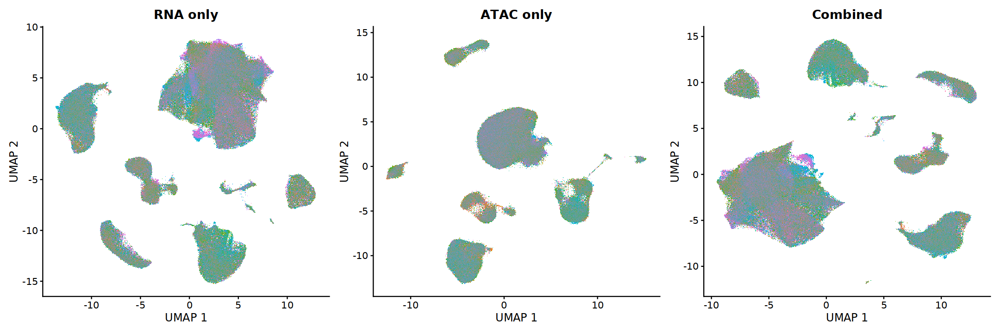

In [241]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='library', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='library', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='library', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



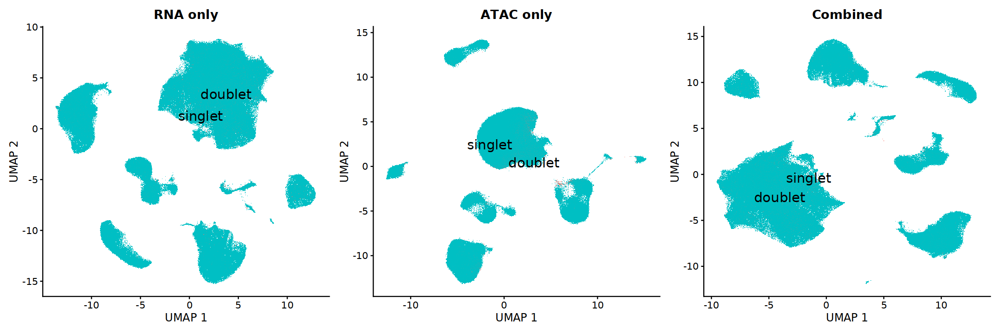

In [242]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='amulet', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='amulet', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='amulet', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



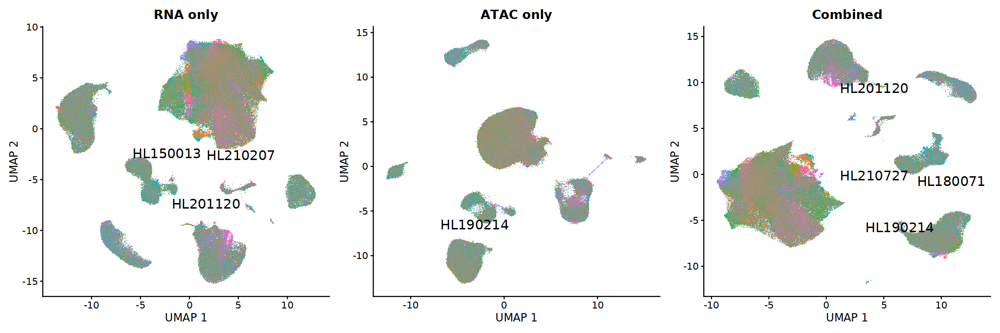

In [243]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='donor_demux', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='donor_demux', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='donor_demux', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

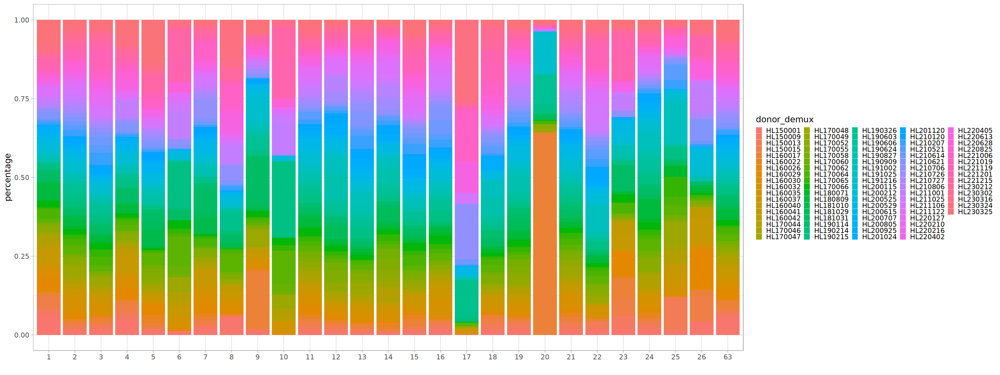

In [244]:
options(repr.plot.width=40, repr.plot.height=15)
#p1 <- DimPlot(adata, reduction='umap.wnn', group.by='donor_demux', split.by='donor_demux', label=FALSE, label.size=10, repel=TRUE)
adata$value <- 1
p2 <- ggplot(adata[[]], aes(fill=donor_demux, y=value, x=seurat_clusters)) + geom_bar(position=position_fill(reverse=TRUE), stat='identity') + xlab('') + ylab('percentage') + theme_light(base_size=24)
p2

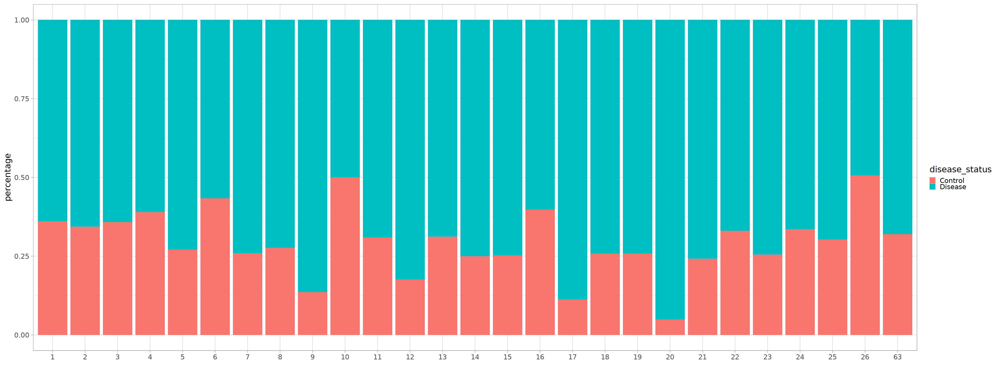

In [245]:
options(repr.plot.width=40, repr.plot.height=15)
#p1 <- DimPlot(adata, reduction='umap.wnn', group.by='donor_demux', split.by='donor_demux', label=FALSE, label.size=10, repel=TRUE)
adata$value <- 1
p2 <- ggplot(adata[[]], aes(fill=disease_status, y=value, x=seurat_clusters)) + geom_bar(position=position_fill(reverse=TRUE), stat='identity') + xlab('') + ylab('percentage') + theme_light(base_size=24)
p2

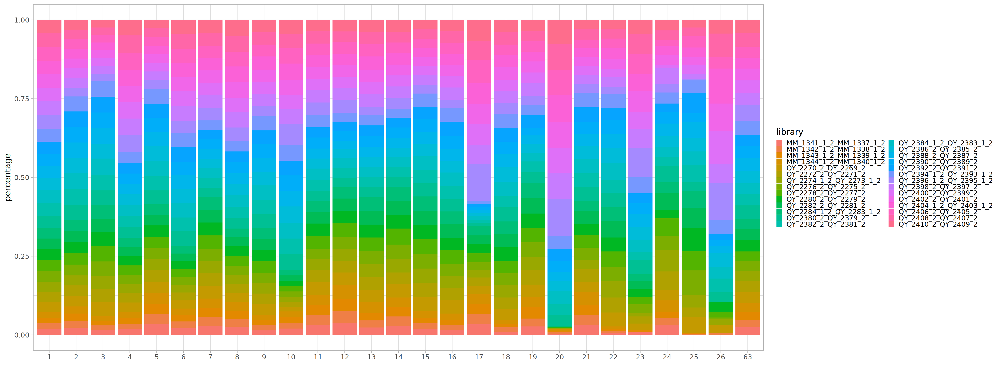

In [246]:
options(repr.plot.width=40, repr.plot.height=15)
#p1 <- DimPlot(adata, reduction='umap.wnn', group.by='donor_demux', split.by='donor_demux', label=FALSE, label.size=10, repel=TRUE)
adata$value <- 1
p2 <- ggplot(adata[[]], aes(fill=library, y=value, x=seurat_clusters)) + geom_bar(position=position_fill(reverse=TRUE), stat='identity') + xlab('') + ylab('percentage') + theme_light(base_size=24)
p2

In [258]:
colnames(adata[[]])

[1] "orig.ident"                        "nCount_RNA"                       
 [3] "nFeature_RNA"                      "percent.mt"                       
 [5] "nCount_RNA_raw"                    "nFeature_RNA_raw"                 
 [7] "donor_demux"                       "nCount_SCT"                       
 [9] "nFeature_SCT"                      "SCT.weight"                       
[11] "seurat_clusters"                   "log_nCount_SCT"                   
[13] "log_nFeature_SCT"                  "lane"                             
[15] "batch"                             "gex_raw_reads"                    
[17] "gex_mapped_reads"                  "gex_conf_intergenic_reads"        
[19] "gex_conf_exonic_reads"             "gex_conf_intronic_reads"          
[21] "gex_conf_exonic_unique_reads"      "gex_conf_exonic_antisense_reads"  
[23] "gex_conf_exonic_dup_reads"         "gex_exonic_umis"                  
[25] "gex_conf_intronic_unique_reads"    "gex_conf_intronic_antisense_reads"
[27] "gex_conf_intronic_dup_reads"       "gex_intronic_umis"                
[29] "gex_conf_txomic_unique_reads"      "gex_umis_count"                   
[31] "gex_genes_count"                   "atac_raw_reads"                   
[33] "atac_unmapped_reads"               "atac_lowmapq"                     
[35] "atac_dup_reads"                    "atac_chimeric_reads"              
[37] "atac_mitochondrial_reads"          "atac_fragments"                   
[39] "atac_TSS_fragments"                "atac_peak_region_fragments"       
[41] "atac_peak_region_cutsites"         "TSS.enrichment"                   
[43] "TSS.percentile"                    "condition"                        
[45] "disease_status"                    "library"                          
[47] "amulet"                            "nCount_Peaks"                     
[49] "nFeature_Peaks"                    "Description"                      
[51] "Age"                               "BMI"                              
[53] "Gender"                            "Alcoholic..2..Drinks.Day."        
[55] "Steatosis.grade"                   "Steatosis.."                      
[57] "Fat.distribution"                  "Lobular.inflammation"             
[59] "Ballooning"                        "Portal.inflammation"              
[61] "Hepatocyte.necrosis"               "MASH.CRN.score..X.8"              
[63] "Diagnosis"                         "Peaks.weight"                     
[65] "value"                             "barcode"                          
[67] "cellsubtype"                       "celltype"                         
[69] "nCount_Peaks_Full"                 "nFeature_Peaks_Full"              
[71] "Fibrosis.stage"                    "celltype.order"

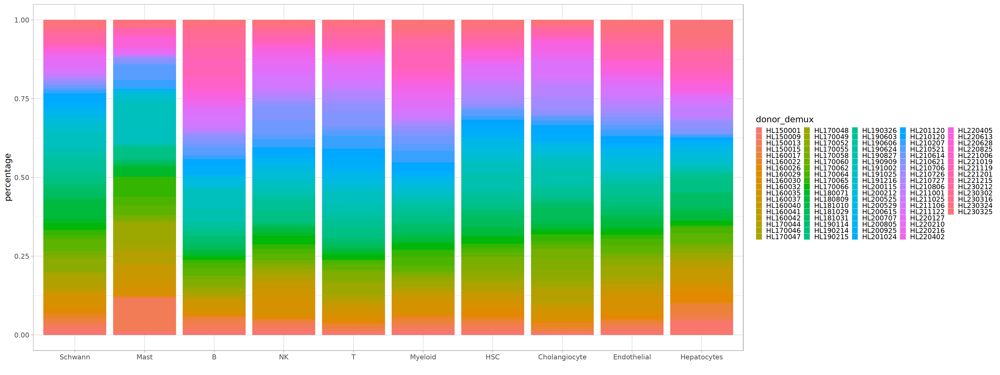

In [259]:
options(repr.plot.width=40, repr.plot.height=15)
#p1 <- DimPlot(adata, reduction='umap.wnn', group.by='donor_demux', split.by='donor_demux', label=FALSE, label.size=10, repel=TRUE)
adata$value <- 1
p2 <- ggplot(adata[[]], aes(fill=donor_demux, y=value, x=celltype.order)) + geom_bar(position=position_fill(reverse=TRUE), stat='identity') + xlab('') + ylab('percentage') + theme_light(base_size=24)
p2

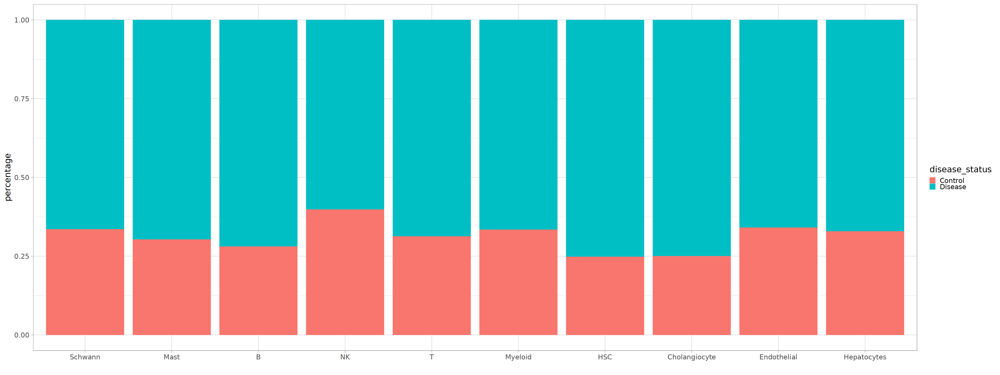

In [260]:
options(repr.plot.width=40, repr.plot.height=15)
#p1 <- DimPlot(adata, reduction='umap.wnn', group.by='donor_demux', split.by='donor_demux', label=FALSE, label.size=10, repel=TRUE)
adata$value <- 1
p2 <- ggplot(adata[[]], aes(fill=disease_status, y=value, x=celltype.order)) + geom_bar(position=position_fill(reverse=TRUE), stat='identity') + xlab('') + ylab('percentage') + theme_light(base_size=24)
p2

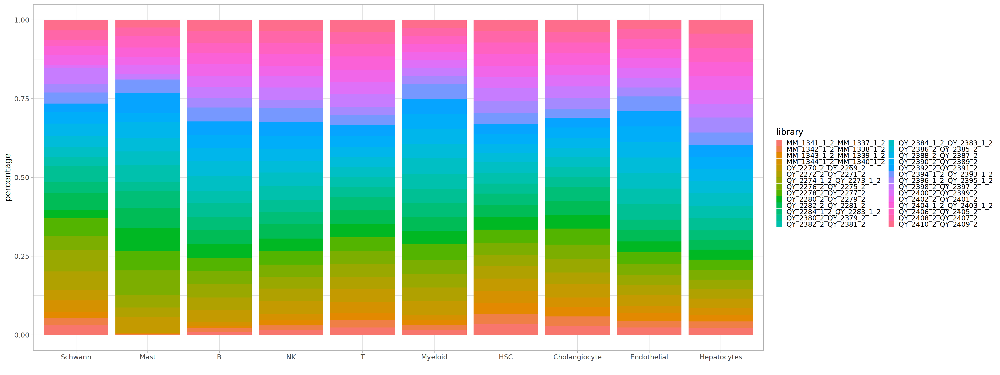

In [261]:
options(repr.plot.width=40, repr.plot.height=15)
#p1 <- DimPlot(adata, reduction='umap.wnn', group.by='donor_demux', split.by='donor_demux', label=FALSE, label.size=10, repel=TRUE)
adata$value <- 1
p2 <- ggplot(adata[[]], aes(fill=library, y=value, x=celltype.order)) + geom_bar(position=position_fill(reverse=TRUE), stat='identity') + xlab('') + ylab('percentage') + theme_light(base_size=24)
p2

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



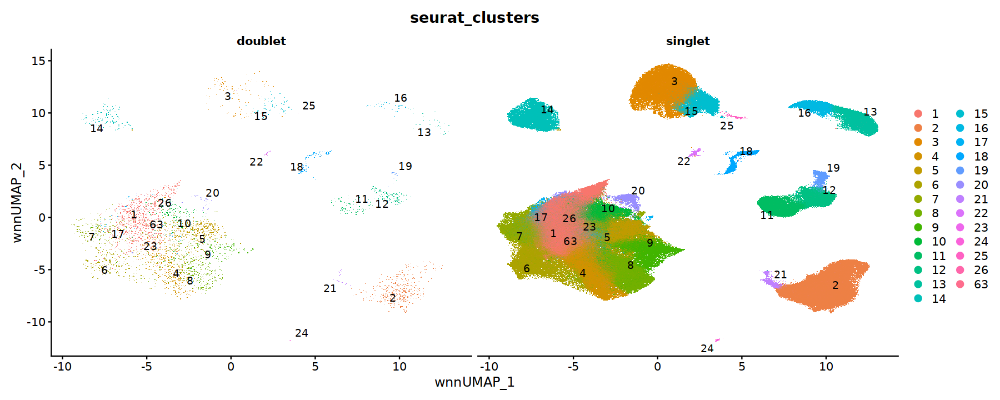

In [250]:
options(repr.plot.width=15, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.wnn', group.by='seurat_clusters', split.by='amulet', label=TRUE, label.size=4, repel=TRUE)
p1

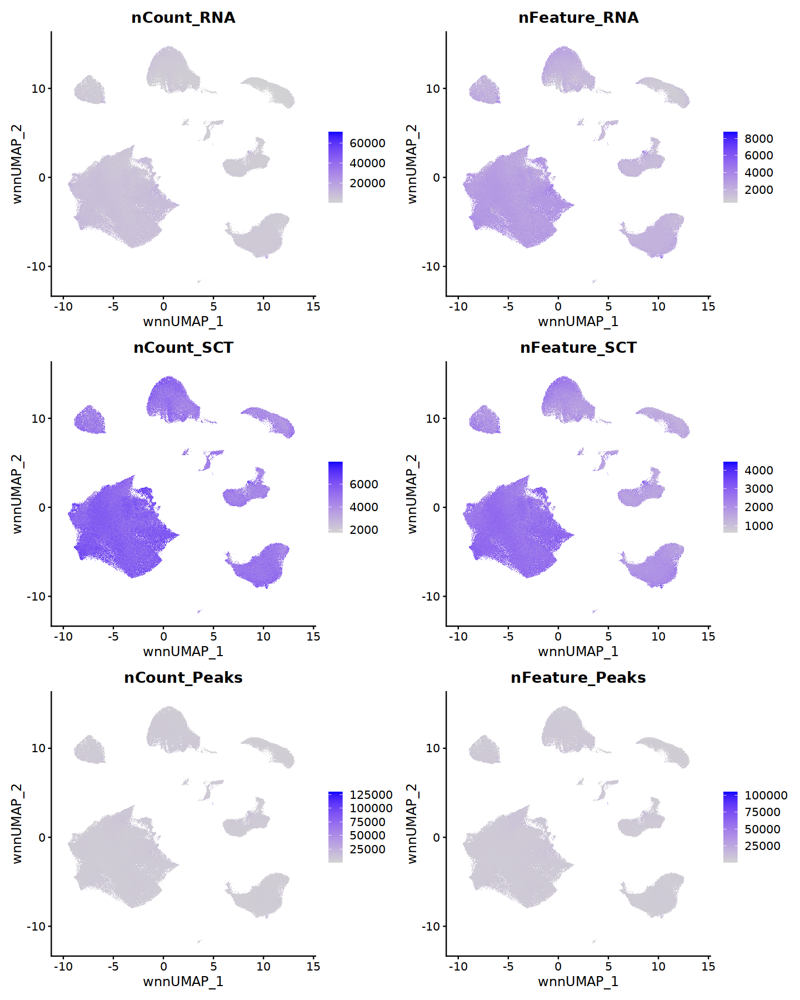

In [251]:
options(repr.plot.width=12, repr.plot.height=15)
FeaturePlot(
  object = adata,
  reduction = "umap.wnn",
  features = c('nCount_RNA', 'nFeature_RNA',
              'nCount_SCT','nFeature_SCT',
              'nCount_Peaks','nFeature_Peaks'),
  ncol = 2,
  raster=TRUE
)

In [252]:
table(adata[[]][c('seurat_clusters','amulet')])

               amulet
seurat_clusters doublet singlet
             1      864   78885
             2      370   59409
             3      101   34709
             4      383   29778
             5      505   20778
             6      250   19784
             7      199   18730
             8      289   18216
             9      176   17018
             10     158   15594
             11      67   14890
             12     126   12850
             13      31   11608
             14     112   10542
             15      68    9936
             16      30    8184
             17      49    6358
             18      94    3526
             19      15    3299
             20      35    3004
             21      16    2180
             22      14    1663
             23       1     544
             24       3     453
             25       1     296
             26       1     161
             27       0       0
             28       0       0
             29       0       0
             30   

In [253]:
table(adata[[]][c('seurat_clusters','amulet')])[,1] * 100 / table(adata[[]][c('seurat_clusters','amulet')])[,2]

1         2         3         4         5         6         7         8 
1.0952653 0.6228013 0.2909908 1.2861844 2.4304553 1.2636474 1.0624666 1.5865173 
        9        10        11        12        13        14        15        16 
1.0341991 1.0132102 0.4499664 0.9805447 0.2670572 1.0624170 0.6843800 0.3665689 
       17        18        19        20        21        22        23        24 
0.7706826 2.6659104 0.4546832 1.1651132 0.7339450 0.8418521 0.1838235 0.6622517 
       25        26        27        28        29        30        31        32 
0.3378378 0.6211180       NaN       NaN       NaN       NaN       NaN       NaN 
       33        34        35        36        37        38        39        40 
      NaN       NaN       NaN       NaN       NaN       NaN       NaN       NaN 
       41        42        43        44        45        46        47        48 
      NaN       NaN       NaN       NaN       NaN       NaN       NaN       NaN 
       49        50        51        52        53        54        55        56 
      NaN       NaN       NaN       NaN       NaN       NaN       NaN       NaN 
       57        58        59        60        61        62        63        64 
      NaN       NaN       NaN       NaN       NaN       NaN 3.0491248       NaN 
       65        66        67        68        69 
      NaN       NaN       NaN       NaN       NaN

In [254]:
table(Idents(adata))


    1     2     3     4     5     6     7     8     9    10    11    12    13 
79749 59779 34810 30161 21283 20034 18929 18505 17194 15752 14957 12976 11639 
   14    15    16    17    18    19    20    21    22    23    24    25    26 
10654 10004  8214  6407  3620  3314  3039  2196  1677   545   456   297   162 
   63 
 1825 

In [255]:
table(adata$seurat_clusters)


    1     2     3     4     5     6     7     8     9    10    11    12    13 
79749 59779 34810 30161 21283 20034 18929 18505 17194 15752 14957 12976 11639 
   14    15    16    17    18    19    20    21    22    23    24    25    26 
10654 10004  8214  6407  3620  3314  3039  2196  1677   545   456   297   162 
   27    28    29    30    31    32    33    34    35    36    37    38    39 
    0     0     0     0     0     0     0     0     0     0     0     0     0 
   40    41    42    43    44    45    46    47    48    49    50    51    52 
    0     0     0     0     0     0     0     0     0     0     0     0     0 
   53    54    55    56    57    58    59    60    61    62    63    64    65 
    0     0     0     0     0     0     0     0     0     0  1825     0     0 
   66    67    68    69 
    0     0     0     0 

In [256]:
table(adata$celltype)


            B Cholangiocyte   Endothelial   Hepatocytes           HSC 
         5297         10654         61975        233608         31224 
         Mast       Myeloid            NK       Schwann             T 
          297         44814          8095           456         11758 

In [257]:
table(adata$cellsubtype)


              Activated.HSC                           B 
                      12809                        1677 
   Central.Vein.Endothelial               Cholangiocyte 
                       1837                       10654 
      Hepatocytes.Senescent          Hepatocytes.Stress 
                      22512                        3227 
          Hepatocytes.Zone1           Hepatocytes.Zone2 
                      41218                       83700 
          Hepatocytes.Zone3                     Kupffer 
                      82951                       35241 
Lipid.Associated.Macrophage       Lymphatic.Endothelial 
                       1898                         460 
                 Macrophage                        Mast 
                       7675                         297 
                Mesenchymal                          NK 
                       3288                        8095 
                     Plasma                Quescent.HSC 
                       3620   

In [6]:
adata <- readRDS('/nfs/lab/projects/nash_nafld_liver/downstream_all/08272024_fnih_liver_final_object_bpcells_final_mats.rds')
adata

An object of class Seurat 
536266 features across 408178 samples within 3 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 2 other assays present: SCT, Peaks
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



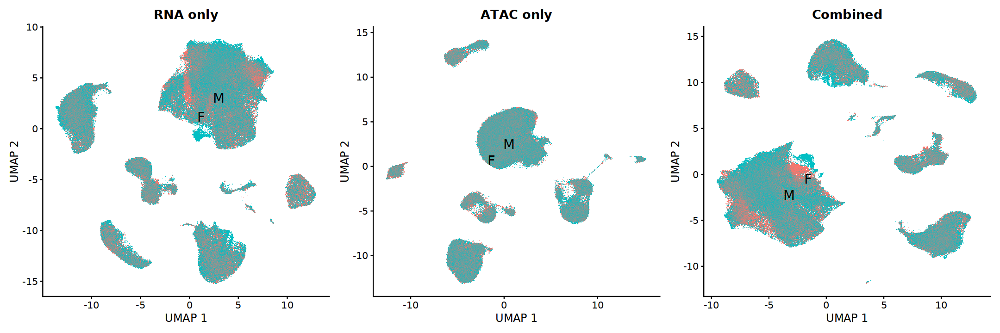

In [8]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='Gender', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='Gender', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='Gender', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



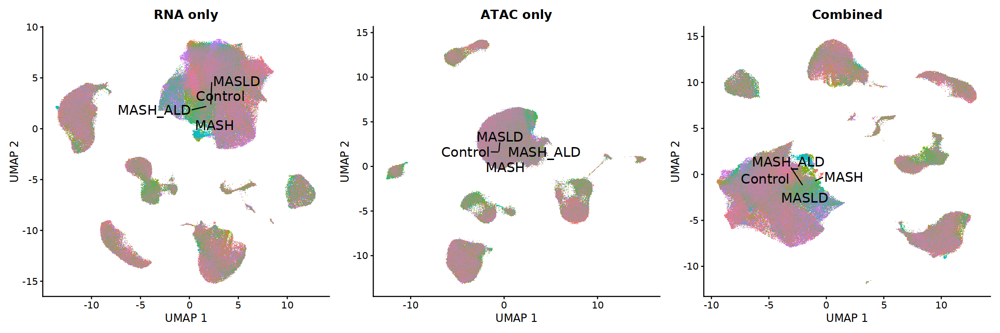

In [11]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='condition', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='condition', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='condition', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



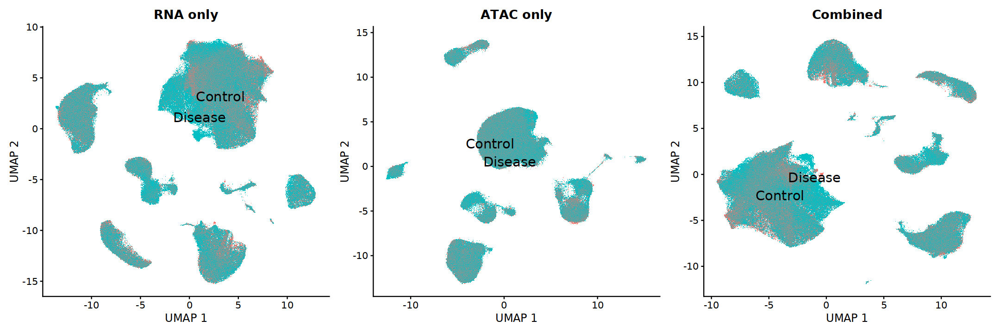

In [12]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='disease_status', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='disease_status', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='disease_status', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



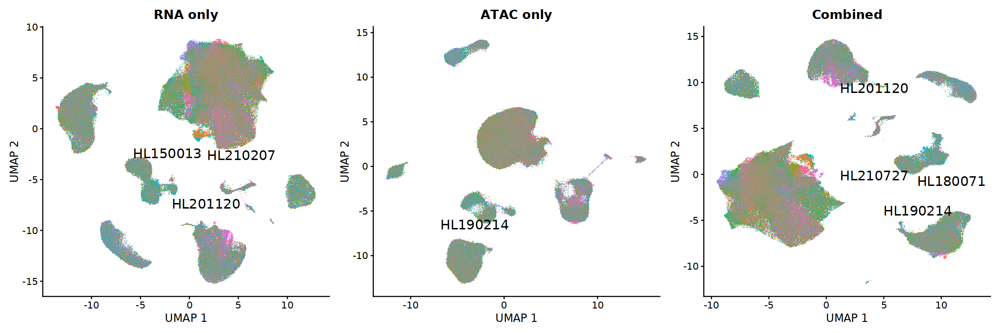

In [13]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='donor_demux', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='donor_demux', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='donor_demux', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



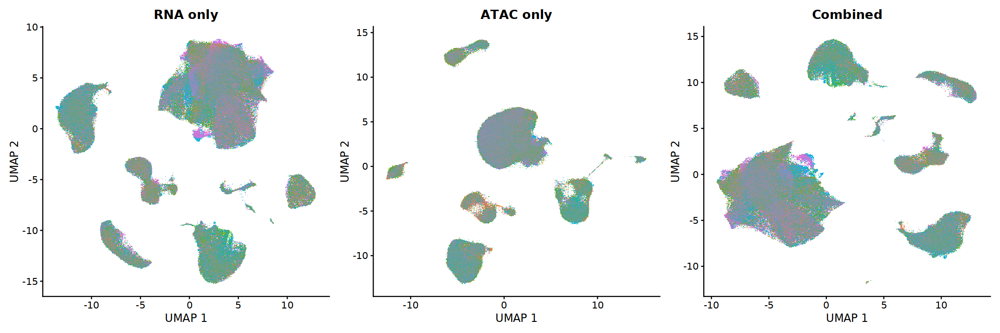

In [14]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='lane', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='lane', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='lane', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



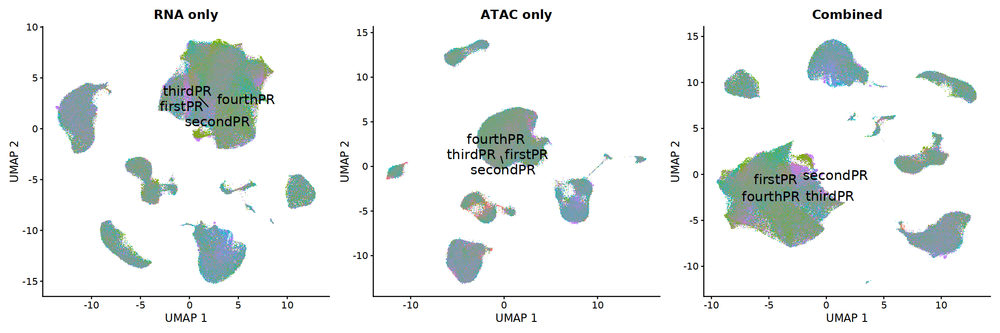

In [15]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='batch', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='batch', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='batch', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



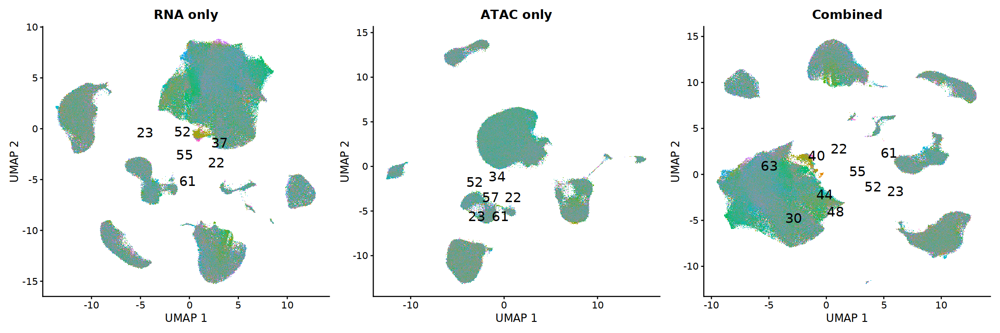

In [16]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='Age', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='Age', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='Age', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



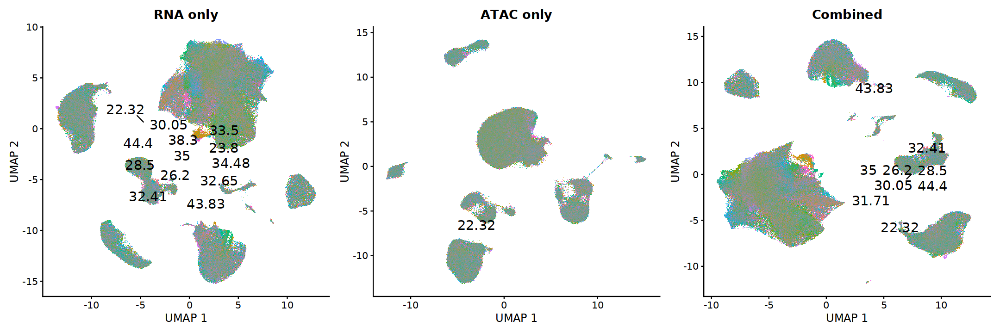

In [17]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='BMI', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='BMI', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='BMI', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



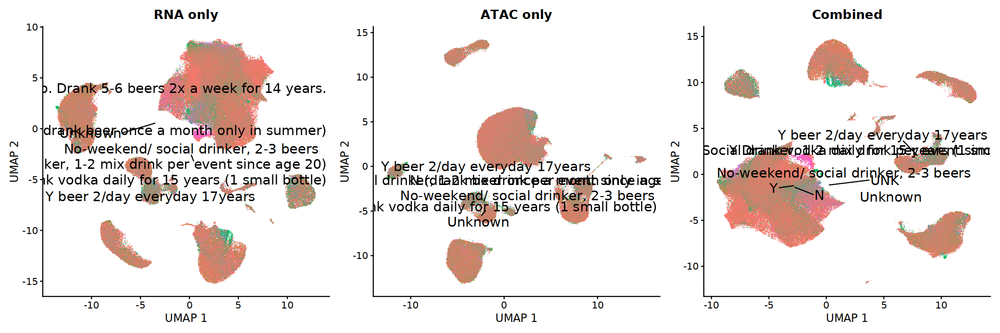

In [18]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='Alcoholic..2..Drinks.Day.', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='Alcoholic..2..Drinks.Day.', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='Alcoholic..2..Drinks.Day.', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



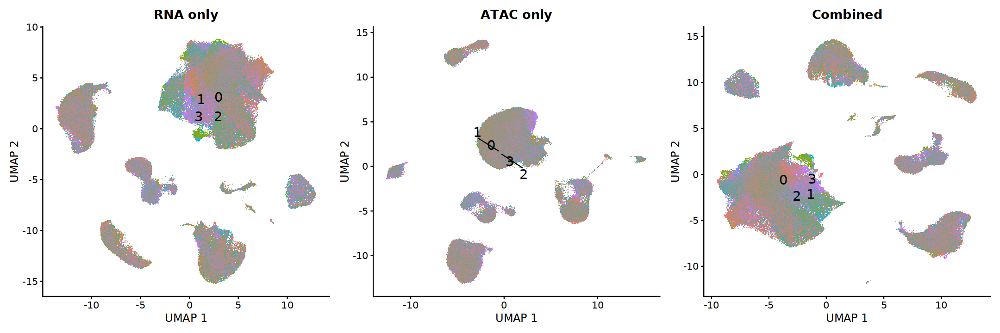

In [19]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='Steatosis.grade', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='Steatosis.grade', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='Steatosis.grade', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



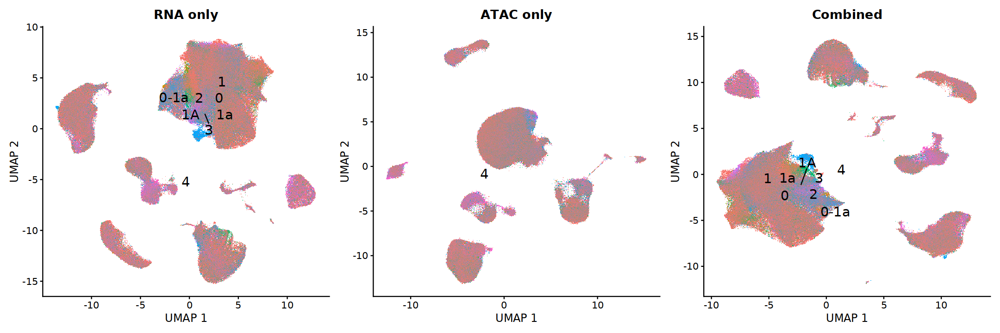

In [20]:
#CHANGE NOTHING
#Making UMAPs that are colored by cluster, will need to assign cell types later. 
options(repr.plot.width=18, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='Fibrosis.stage', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='Fibrosis.stage', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='Fibrosis.stage', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

In [21]:
colnames(adata[[]])

[1] "orig.ident"                        "nCount_RNA"                       
 [3] "nFeature_RNA"                      "percent.mt"                       
 [5] "nCount_RNA_raw"                    "nFeature_RNA_raw"                 
 [7] "donor_demux"                       "nCount_SCT"                       
 [9] "nFeature_SCT"                      "SCT.weight"                       
[11] "seurat_clusters"                   "log_nCount_SCT"                   
[13] "log_nFeature_SCT"                  "lane"                             
[15] "batch"                             "gex_raw_reads"                    
[17] "gex_mapped_reads"                  "gex_conf_intergenic_reads"        
[19] "gex_conf_exonic_reads"             "gex_conf_intronic_reads"          
[21] "gex_conf_exonic_unique_reads"      "gex_conf_exonic_antisense_reads"  
[23] "gex_conf_exonic_dup_reads"         "gex_exonic_umis"                  
[25] "gex_conf_intronic_unique_reads"    "gex_conf_intronic_antisense_reads"
[27] "gex_conf_intronic_dup_reads"       "gex_intronic_umis"                
[29] "gex_conf_txomic_unique_reads"      "gex_umis_count"                   
[31] "gex_genes_count"                   "atac_raw_reads"                   
[33] "atac_unmapped_reads"               "atac_lowmapq"                     
[35] "atac_dup_reads"                    "atac_chimeric_reads"              
[37] "atac_mitochondrial_reads"          "atac_fragments"                   
[39] "atac_TSS_fragments"                "atac_peak_region_fragments"       
[41] "atac_peak_region_cutsites"         "TSS.enrichment"                   
[43] "TSS.percentile"                    "condition"                        
[45] "disease_status"                    "library"                          
[47] "amulet"                            "nCount_Peaks"                     
[49] "nFeature_Peaks"                    "Description"                      
[51] "Age"                               "BMI"                              
[53] "Gender"                            "Alcoholic..2..Drinks.Day."        
[55] "Steatosis.grade"                   "Steatosis.."                      
[57] "Fat.distribution"                  "Lobular.inflammation"             
[59] "Ballooning"                        "Portal.inflammation"              
[61] "Hepatocyte.necrosis"               "MASH.CRN.score..X.8"              
[63] "Diagnosis"                         "Peaks.weight"                     
[65] "value"                             "barcode"                          
[67] "cellsubtype"                       "celltype"                         
[69] "nCount_Peaks_Full"                 "nFeature_Peaks_Full"              
[71] "Fibrosis.stage"

In [22]:
head(adata$library)

MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1 
                 "MM_1341_1_2_MM_1337_1_2" 
MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1 
                 "MM_1341_1_2_MM_1337_1_2" 
MM_1341_1_2_MM_1337_1_2_AAACAGCCATCGTTCT-1 
                 "MM_1341_1_2_MM_1337_1_2" 
MM_1341_1_2_MM_1337_1_2_AAACAGCCATGGCCTG-1 
                 "MM_1341_1_2_MM_1337_1_2" 
MM_1341_1_2_MM_1337_1_2_AAACAGCCATGTTGGC-1 
                 "MM_1341_1_2_MM_1337_1_2" 
MM_1341_1_2_MM_1337_1_2_AAACAGCCATTGACAT-1 
                 "MM_1341_1_2_MM_1337_1_2"

In [6]:
adata <- qs::qread('/nfs/lab/tscc/welison/FNIH.Liver/FNIH_Liver_Multiome_DPT.HSC.qs')
adata

An object of class Seurat 
36601 features across 41540 samples within 1 assay 
Active assay: RNA (36601 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 3 dimensional reductions calculated: pca, harmony.rna, umap

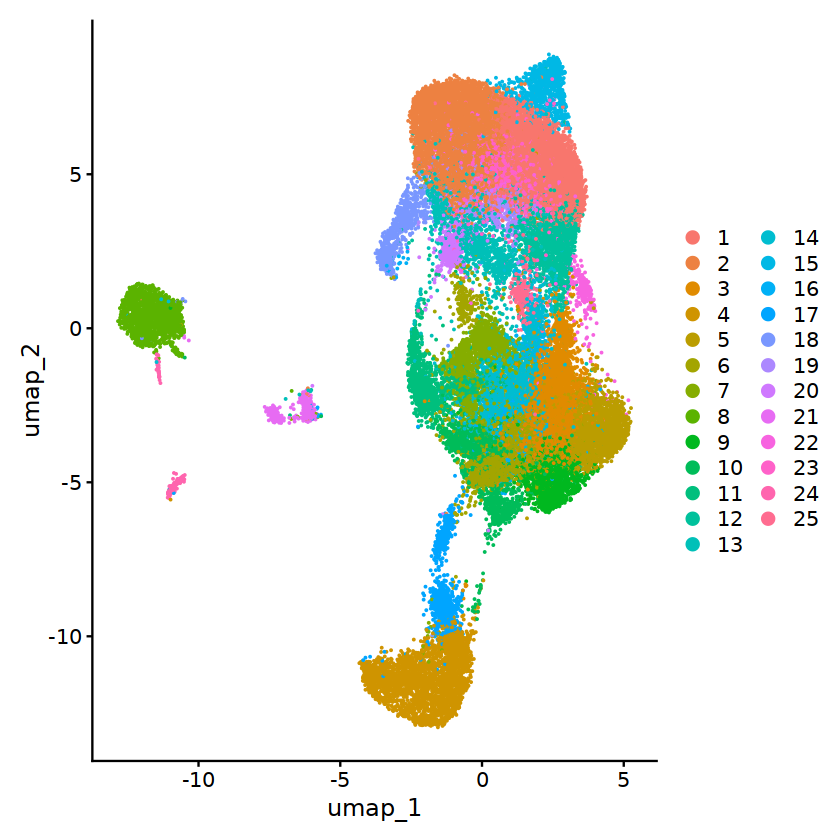

In [7]:
DimPlot(adata, reduction = 'umap')

In [8]:
HSC.adata <- readRDS('/nfs/lab/tscc/welison/FNIH.Liver/subtypes/HSC/HSC_subtype_UnionPeaks_seurat_object.RDS')
HSC.adata

An object of class Seurat 
910567 features across 31224 samples within 5 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 4 other assays present: SCT, Peaks.1, Peaks.2, Subtype.Peaks
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

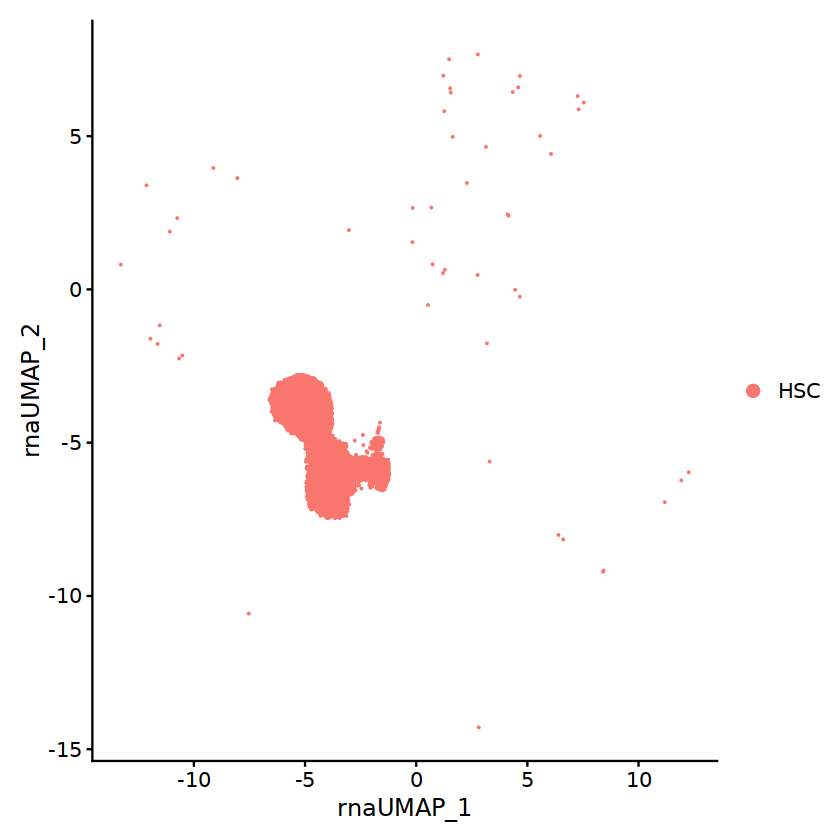

In [9]:
DimPlot(HSC.adata, reduction = 'umap.rna')

In [10]:
# RNA analysis
HSC.adata.2 <- HSC.adata
DefaultAssay(HSC.adata.2) <- 'RNA'
HSC.adata.2 <- SCTransform(HSC.adata.2, verbose=FALSE)
gc(reset = TRUE)
HSC.adata.2 <- RunPCA(HSC.adata.2)
HSC.adata.2 <- RunHarmony(HSC.adata.2, group.by.vars= c('batch', 'donor_demux'), assay.use='SCT', reduction.save='harmony.rna')
HSC.adata.2 <- RunUMAP(HSC.adata.2, dims=1:50, reduction='harmony.rna', reduction.name='umap.rna', reduction.key='rnaUMAP_')

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,13601392,726.4,20237481,1080.8,13601392,726.4
Vcells,2665357485,20335.1,7043004698,53733.9,2665357485,20335.1


PC_ 1 
Positive:  ADAMTSL1, AF165147.1, RBMS3, RELN, DACH1, COL25A1, ZFPM2, HGF, CRIM1, ANO3 
	   LIFR, ANK3, PWRN1, DMD, SYT1, IGFBP3, SGCZ, PCDH9, CCBE1, PDE4D 
	   HHIP, NR1H4, ADGRL2, PRKG1, ANKS1A, ITGA9, ARHGAP15, CALD1, CADM2, AL355612.1 
Negative:  AL391117.1, CPS1, CYP3A5, CP, CYP2C8, FGL1, CYP2C9, PIK3C2G, A1CF, ACSM2B 
	   SORBS2, TAT, SLC38A4, C9, AGMO, FGB, TENM2, SLCO1B1, C5, NEAT1 
	   PAH, CRP, LINC00907, ACSM2A, MIR122HG, CPB2, LINC01146, DPYS, FOXP2, BAAT 
PC_ 2 
Positive:  LINC02388, KALRN, CACNA1C, C7, ATP1B3, EBF1, PLCXD3, KCND2, SERPINE1, NEGR1 
	   LAMA2, CRISPLD2, SCN7A, NEAT1, PRR16, AC020637.1, RCAN2, MGAT4C, BICC1, MIR100HG 
	   SLIT3, NAV3, CDH19, CARMIL1, MAMDC2, LAMC3, ITGBL1, VCAN, COL4A1, CYP7B1 
Negative:  ADAMTSL1, AF165147.1, RELN, COL25A1, DACH1, SYT1, NR1H4, IGFBP3, SGCZ, HHIP 
	   LIFR, HGF, ANO3, TLCD4, CADM2, RBMS3, GPC6, FGFR2, PWRN1, ATRNL1 
	   ADGRL2, EXT1, FGF13, ANKS1A, ARHGAP15, RXFP1, COLEC10, DMD, CAMK4, LINC01695 
PC_ 3 
Positive:  EBF1

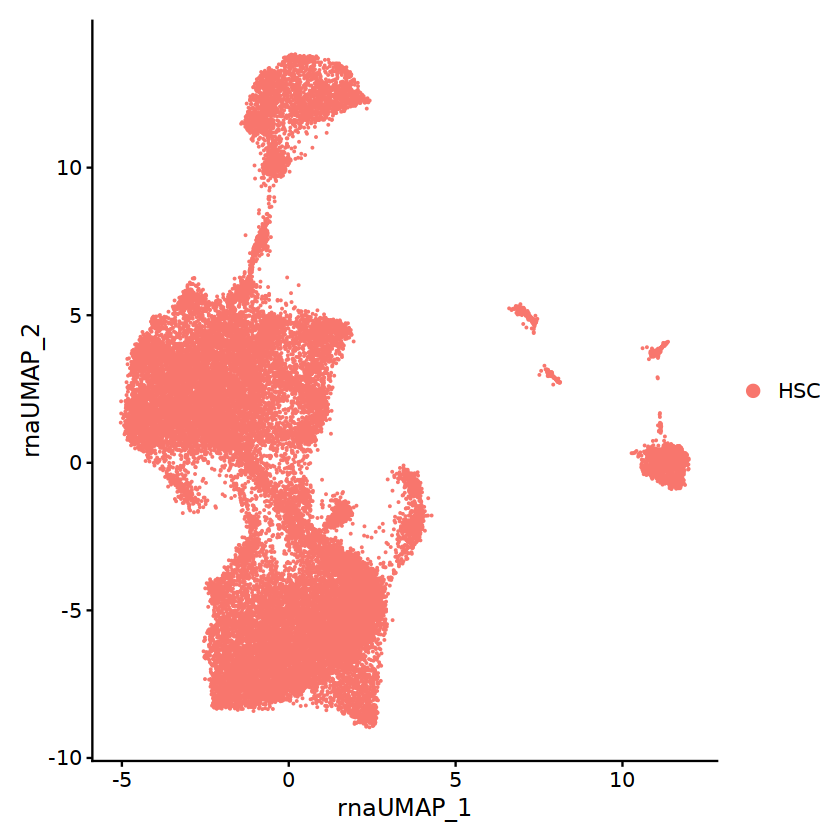

In [11]:
DimPlot(HSC.adata.2, reduction = 'umap.rna')

In [12]:
HSC.adata.2 <- FindNeighbors(HSC.adata.2, reduction='harmony.rna', dims.list=1:50, verbose=TRUE)
HSC.adata.2 <- FindClusters(HSC.adata.2, algorithm=4,  resolution = 0.5, verbose=TRUE, method = 'igraph')

Computing nearest neighbor graph

Computing SNN



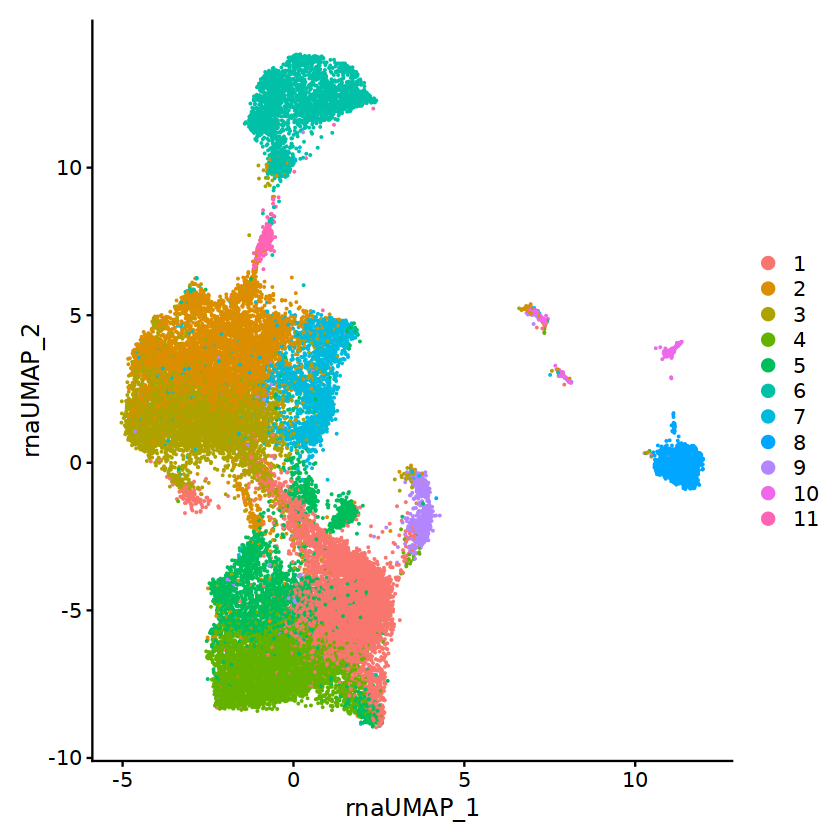

In [13]:
DimPlot(HSC.adata.2, reduction = 'umap.rna')

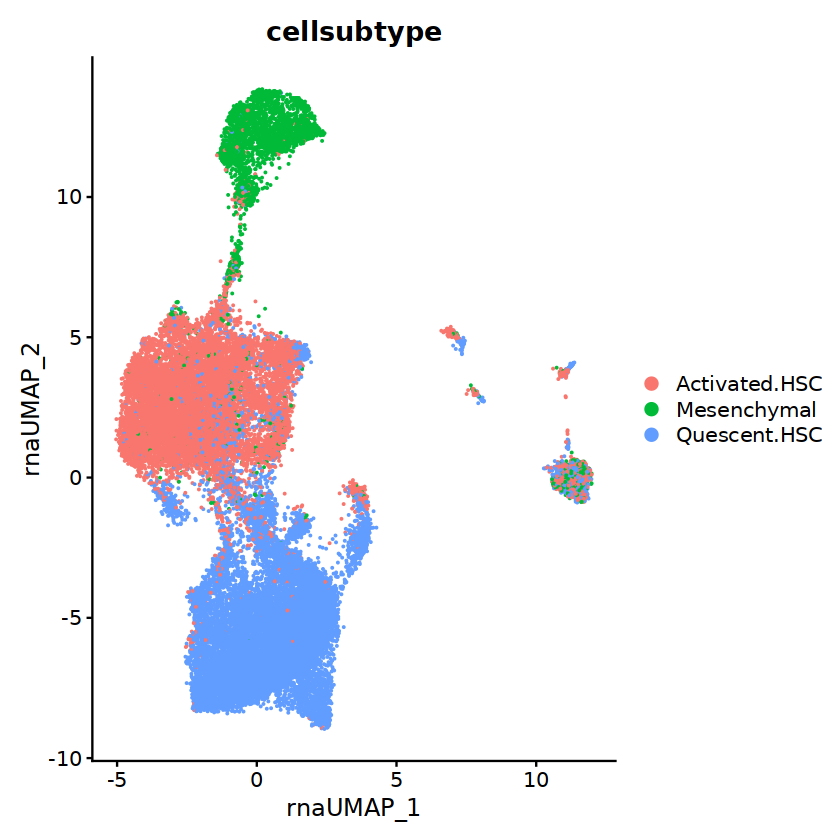

In [18]:
DimPlot(HSC.adata.2, reduction = 'umap.rna', group.by = 'cellsubtype')

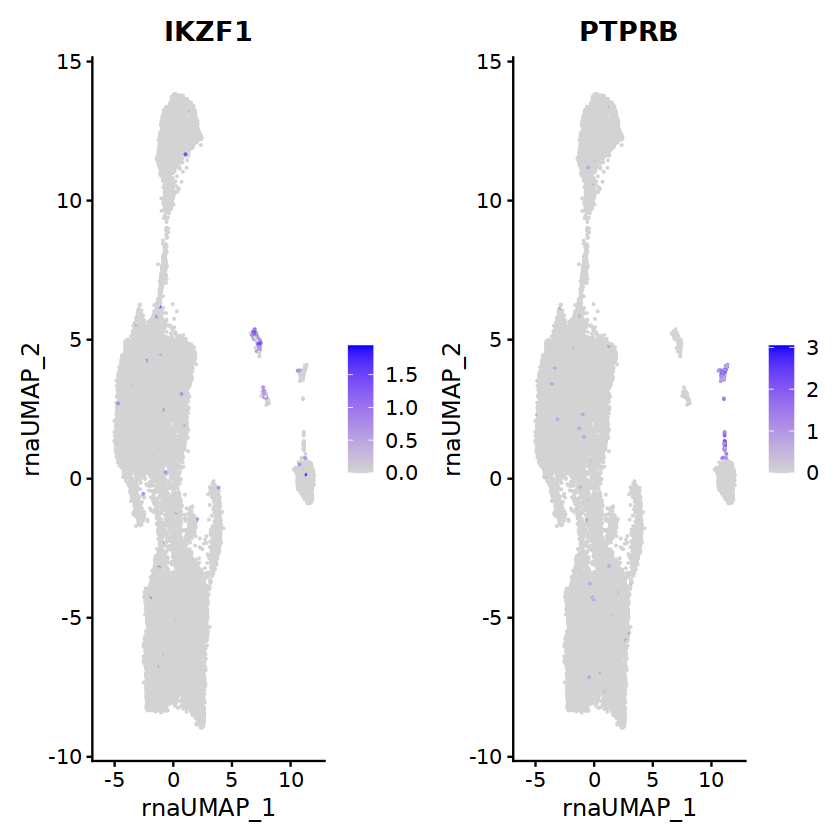

In [19]:
FeaturePlot(HSC.adata.2, reduction = 'umap.rna', features = c('IKZF1','PTPRB'))

In [15]:
colnames(HSC.adata.2[[]])

[1] "orig.ident"                        "nCount_RNA"                       
 [3] "nFeature_RNA"                      "percent.mt"                       
 [5] "nCount_RNA_raw"                    "nFeature_RNA_raw"                 
 [7] "donor_demux"                       "nCount_SCT"                       
 [9] "nFeature_SCT"                      "SCT.weight"                       
[11] "seurat_clusters"                   "log_nCount_SCT"                   
[13] "log_nFeature_SCT"                  "lane"                             
[15] "batch"                             "gex_raw_reads"                    
[17] "gex_mapped_reads"                  "gex_conf_intergenic_reads"        
[19] "gex_conf_exonic_reads"             "gex_conf_intronic_reads"          
[21] "gex_conf_exonic_unique_reads"      "gex_conf_exonic_antisense_reads"  
[23] "gex_conf_exonic_dup_reads"         "gex_exonic_umis"                  
[25] "gex_conf_intronic_unique_reads"    "gex_conf_intronic_antisense_reads"
[27] "gex_conf_intronic_dup_reads"       "gex_intronic_umis"                
[29] "gex_conf_txomic_unique_reads"      "gex_umis_count"                   
[31] "gex_genes_count"                   "atac_raw_reads"                   
[33] "atac_unmapped_reads"               "atac_lowmapq"                     
[35] "atac_dup_reads"                    "atac_chimeric_reads"              
[37] "atac_mitochondrial_reads"          "atac_fragments"                   
[39] "atac_TSS_fragments"                "atac_peak_region_fragments"       
[41] "atac_peak_region_cutsites"         "TSS.enrichment"                   
[43] "TSS.percentile"                    "condition"                        
[45] "disease_status"                    "library"                          
[47] "amulet"                            "nCount_Peaks"                     
[49] "nFeature_Peaks"                    "Description"                      
[51] "Age"                               "BMI"                              
[53] "Gender"                            "Alcoholic..2..Drinks.Day."        
[55] "Steatosis.grade"                   "Steatosis.."                      
[57] "Fat.distribution"                  "Lobular.inflammation"             
[59] "Ballooning"                        "Portal.inflammation"              
[61] "Hepatocyte.necrosis"               "MASH.CRN.score..X.8"              
[63] "Diagnosis"                         "Peaks.weight"                     
[65] "value"                             "barcode"                          
[67] "cellsubtype"                       "celltype"                         
[69] "nCount_Peaks_Full"                 "nFeature_Peaks_Full"              
[71] "Fibrosis.stage"                    "nCount_Peaks.1"                   
[73] "nFeature_Peaks.1"                  "nCount_Peaks.2"                   
[75] "nFeature_Peaks.2"                  "nCount_Subtype.Peaks"             
[77] "nFeature_Subtype.Peaks"            "SCT_snn_res.0.5"

In [17]:
table(HSC.adata.2[[]][c('seurat_clusters','cellsubtype')])

               cellsubtype
seurat_clusters Activated.HSC Mesenchymal Quescent.HSC
             1            130           5         5587
             2           5084         123          467
             3           4501          74          508
             4             10           0         4337
             5            119           9         2859
             6             73        2536           30
             7           1953          51          258
             8            399         222          349
             9            203          12          501
             10           266          41          223
             11            71         215            8

In [21]:
table(HSC.adata.2[[]][c('seurat_clusters','condition')])

               condition
seurat_clusters Control MASH MASL MetALD
             1     1818 1300 2166    438
             2      864 2562  844   1404
             3      777 1900 1277   1129
             4     1417  994 1588    348
             5     1066  925  577    419
             6      667  815  682    475
             7      470  965  347    480
             8      285  282  264    139
             9      172  233  211    100
             10     126  204  108     92
             11      92  100   57     45

In [23]:
res <- FindMarkers(HSC.adata.2, `ident.1` = 8)
rownames(head(res, n=20))
res

[1] "AL391117.1" "A1CF"       "PIK3C2G"    "ASGR1"      "CP"        
 [6] "CYP3A5"     "SORBS2"     "PLG"        "ACSM2B"     "PAH"       
[11] "AGMO"       "DPYS"       "C5"         "FOXP2"      "APOB"      
[16] "SLCO1B1"    "C9"         "MIR122HG"   "CPB2"       "FGL1"

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AL391117.1,0,7.371029,0.935,0.034,0
A1CF,0,6.631813,0.920,0.030,0
PIK3C2G,0,7.142137,0.885,0.020,0
ASGR1,0,6.160793,0.884,0.030,0
CP,0,6.083618,0.906,0.068,0
CYP3A5,0,6.747091,0.887,0.050,0
SORBS2,0,5.020878,0.922,0.088,0
PLG,0,5.850438,0.872,0.039,0
ACSM2B,0,6.760591,0.859,0.026,0


# Subset to one mat for chromvar

In [1]:
adata <- readRDS('/nfs/lab/projects/nash_nafld_liver/downstream_all/10222024_fnih_liver_final_object.rds')
adata

Loading required package: SeuratObject

Warning message:
“package ‘SeuratObject’ was built under R version 4.3.3”
Loading required package: sp

Warning message:
“package ‘sp’ was built under R version 4.3.3”

Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


Loading required package: Seurat

Warning message:
“package ‘Seurat’ was built under R version 4.3.3”
Loading required package: Signac



An object of class Seurat 
671932 features across 408178 samples within 4 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 3 other assays present: SCT, Peaks.1, Peaks.2
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

In [4]:
nrow(adata$Peaks.1)
nrow(adata$Peaks.2)

[1] 300000

[1] 311576

In [6]:
feat.sums.1 <- rowSums(adata$Peaks.1)
feat.sums.2 <- rowSums(adata$Peaks.2)
feat.sums <- c(feat.sums.1, feat.sums.2)
head(feat.sums)

chr1-9967-10267   chr1-16085-16372   chr1-17357-17657   chr1-29216-29497 
             21495               1749               2657               2192 
chr1-102789-103089 chr1-136647-136947 
              5279               1443

Warning message:
“Removed 11 rows containing non-finite outside the scale range (`stat_bin()`).”


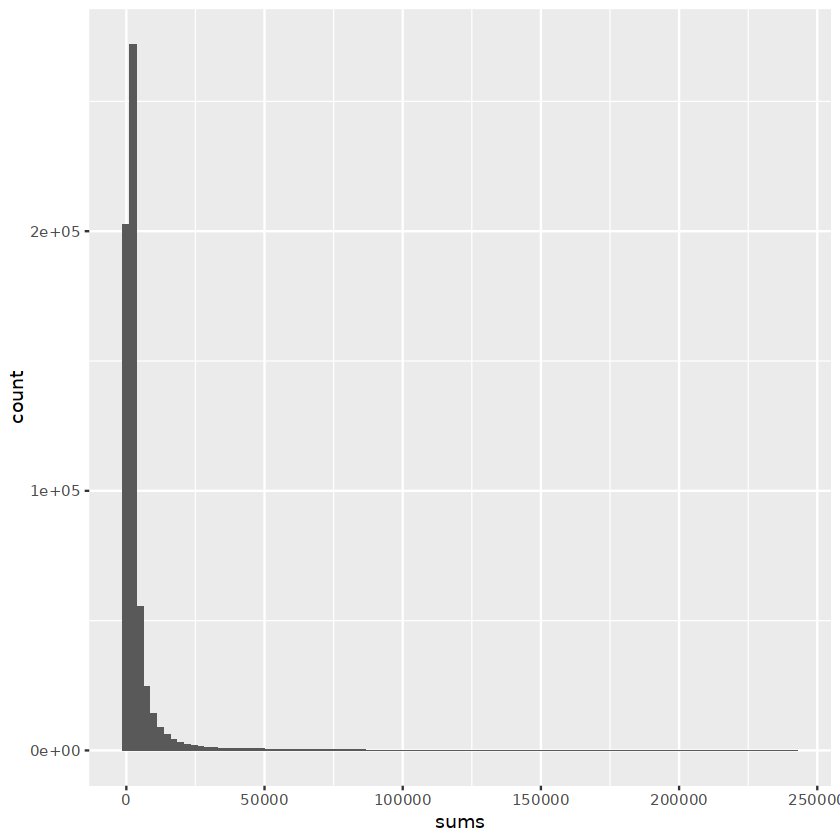

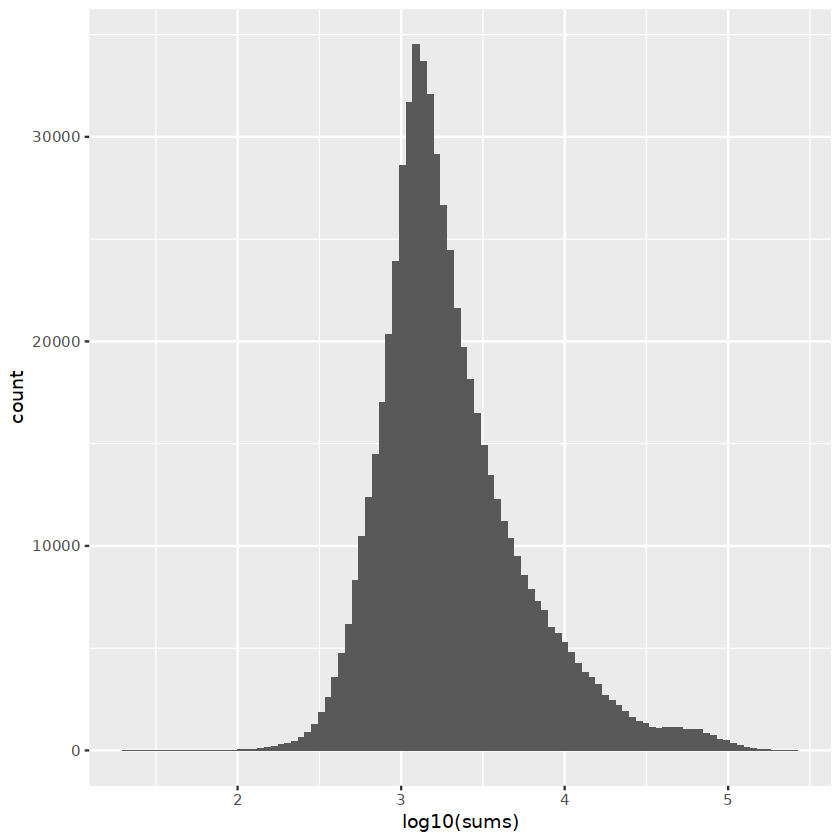

In [7]:
library(ggplot2)
ggplot(data.frame(sums=feat.sums), aes(x=sums)) + geom_histogram(bins=100)
ggplot(data.frame(sums=feat.sums), aes(x=log10(sums))) + geom_histogram(bins=100)

In [27]:
quantile(feat.sums, probs = .15)

15% 
830

In [28]:
peaks.1.subset <- adata$Peaks.1$counts[feat.sums.1[feat.sums.1 > 830],]
dim(peaks.1.subset)
head(peaks.1.subset)
peaks.1.subset@p[[length(peaks.1.subset@p)]]

[1] 260911 408178

  [[ suppressing 34 column names ‘MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1’, ‘MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1’, ‘MM_1341_1_2_MM_1337_1_2_AAACAGCCATCGTTCT-1’ ... ]]



6 x 408178 sparse Matrix of class "dgCMatrix"
                                                                              
chr1-70458124-70458424 . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-5956255-5956486   . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-8335503-8335803   . . 1 . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-7095353-7095653   . 1 . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-15756444-15756744 . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-3734782-3734981   . . . . . . . . . . . . . . . . . . . . . . . . . . . .
                                         
chr1-70458124-70458424 . . . . . . ......
chr1-5956255-5956486   . . . . . . ......
chr1-8335503-8335803   . . . . . . ......
chr1-7095353-7095653   . . . . . . ......
chr1-15756444-15756744 . . . . . . ......
chr1-3734782-3734981   . . . . . . ......

 .....suppressing 408144 columns in show(); maybe adjust options(max.print=, width=)
 ....................

[1] 1108927237

In [29]:
peaks.2.subset <- adata$Peaks.2$counts[feat.sums.2[feat.sums.2 > 830],]
dim(peaks.2.subset)
head(peaks.2.subset)
peaks.2.subset@p[[length(peaks.2.subset@p)]]

[1] 258778 408178

  [[ suppressing 34 column names ‘MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1’, ‘MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1’, ‘MM_1341_1_2_MM_1337_1_2_AAACAGCCATCGTTCT-1’ ... ]]



6 x 408178 sparse Matrix of class "dgCMatrix"
                                                                              
chr2-134173401-134173701 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr2-130950376-130950676 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr2-134206627-134206927 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr2-154484764-154485064 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr2-219560486-219560786 . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr2-139454933-139455134 . . . . . . . . . . . . . . . . . . . . . . . . . . .
                                             
chr2-134173401-134173701 . . . . . . . ......
chr2-130950376-130950676 . . . . . . . ......
chr2-134206627-134206927 . . . . 1 . . ......
chr2-154484764-154485064 . . . . . . . ......
chr2-219560486-219560786 . . . . . . . ......
chr2-139454933-139455134 . . . . . . . ......

 .....suppressing 408144 columns in show(); maybe adjust options(max.print=, w

[1] 916099371

In [25]:
adata$Peaks.1$counts@p[[length(adata$Peaks.1$counts@p)]]
adata$Peaks.2$counts@p[[length(adata$Peaks.2$counts@p)]]

[1] 1259616666

[1] 1123801116

In [11]:
2^31
(adata$Peaks.1$counts@p[[length(adata$Peaks.1$counts@p)]]) + (adata$Peaks.2$counts@p[[length(adata$Peaks.2$counts@p)]])

[1] 2147483648

Warning message in (adata$Peaks.1$counts@p[[length(adata$Peaks.1$counts@p)]]) + :
“NAs produced by integer overflow”


[1] NA

In [ ]:
1259616666
1123801116
2383417782

2147483648

# 15%
1108927237
 916099371
2025026608

In [30]:
full.subset.mat <- rbind(peaks.1.subset, peaks.2.subset)
dim(full.subset.mat)
head(full.subset.mat)

[1] 519689 408178

  [[ suppressing 34 column names ‘MM_1341_1_2_MM_1337_1_2_AAACAGCCACAGACTC-1’, ‘MM_1341_1_2_MM_1337_1_2_AAACAGCCAGTTATGT-1’, ‘MM_1341_1_2_MM_1337_1_2_AAACAGCCATCGTTCT-1’ ... ]]



6 x 408178 sparse Matrix of class "dgCMatrix"
                                                                              
chr1-70458124-70458424 . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-5956255-5956486   . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-8335503-8335803   . . 1 . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-7095353-7095653   . 1 . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-15756444-15756744 . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-3734782-3734981   . . . . . . . . . . . . . . . . . . . . . . . . . . . .
                                         
chr1-70458124-70458424 . . . . . . ......
chr1-5956255-5956486   . . . . . . ......
chr1-8335503-8335803   . . . . . . ......
chr1-7095353-7095653   . . . . . . ......
chr1-15756444-15756744 . . . . . . ......
chr1-3734782-3734981   . . . . . . ......

 .....suppressing 408144 columns in show(); maybe adjust options(max.print=, width=)
 ....................

In [31]:
adata

An object of class Seurat 
671932 features across 408178 samples within 4 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 3 other assays present: SCT, Peaks.1, Peaks.2
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

In [38]:
annotations <- GetGRangesFromEnsDb(ensdb=EnsDb.Hsapiens.v86)
seqlevelsStyle(annotations) <- 'UCSC'
genome(annotations) <- 'hg38'

In [39]:
adata$Peaks <- CreateChromatinAssay(counts=full.subset.mat[,colnames(adata$RNA$counts)],
                                   min.cells=0, min.features=0, fragments=Fragments(adata$Peaks.2),
                                   sep=c('-', '-'), annotations=annotations, genome='hg38')
adata
adata$Peaks

An object of class Seurat 
1191621 features across 408178 samples within 5 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 4 other assays present: SCT, Peaks.1, Peaks.2, Peaks
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

ChromatinAssay data with 519689 features for 408178 cells
Variable features: 0 
Genome: hg38 
Annotation present: FALSE 
Motifs present: FALSE 
Fragment files: 18 

In [40]:
adata$Peaks.1 <- NULL
adata$Peaks.2 <- NULL

In [41]:
saveRDS(adata, '/nfs/lab/projects/nash_nafld_liver/downstream_all/10222024_fnih_liver_final_object_one_mat_for_chromvar.rds')

In [42]:
adata <- NULL
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,15205377,812.1,29508932,1576.0,29508932,1576.0
Vcells,6134749594,46804.5,26019084436,198509.9,31448683393,239934.5
